# Дифракционная нейронная сеть

##### Импорт зависимостей

In [4]:
!pip install -q --upgrade cvnn
!pip install -q tf-keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [5]:
import os
import warnings
import string
import tensorflow as tf
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.gridspec import GridSpec
from matplotlib.colors import hsv_to_rgb

from PIL import Image
from IPython.display import display
import tensorflow_datasets as tfds
import cvnn.layers as complex_layers

from tensorflow import keras
from keras.datasets import fashion_mnist



from tensorflow.keras.models import Model
from tensorflow.keras.losses import Loss
from tensorflow.keras.layers import Layer,Lambda,InputLayer
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.constraints import Constraint
from tensorflow.data.experimental import copy_to_device


tfds.disable_progress_bar()
warnings.filterwarnings('ignore')

2025-10-31 22:00:14.003252: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761948014.181757      45 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761948014.232738      45 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        device = '/GPU:0'
        print("Используется GPU:", gpus[0])
    except RuntimeError as e:
        print("Не удалось настроить GPU:", e)
        device = '/CPU:0'
else:
    print("GPU не найден. Используется CPU.")
    device = '/CPU:0'

Используется GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [7]:
colors = {
      'train': '#4F518C',
      'val': '#CD5334',
      'loss': '#4F518C',
      'acc': '#09814A',
      'bg': '#FFFFFF',
      'grid': '#d9d9d9'
}

params = {
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"],
    "font.size": 14,
    "axes.labelsize": 13,
    "axes.titlesize": 15,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "figure.figsize": (13, 5.5),
    "figure.dpi": 300,
    "lines.linewidth": 2.5,
    "lines.markersize": 8,
    "axes.titlepad": 14
}

# 1. Загрузка и обзор данных

Установим параметры системы:

In [8]:
LAYER_SIZE = 200
BUFFER_SIZE = 1000
BATCH_SIZE = 16
UP_SAMPLING_SIZE = 140

learning_rate = 0.001
epochs = 4

DATASET_NAME = 'mnist'

Загрузка данных:

In [9]:
datasets, info = tfds.load(name=DATASET_NAME, with_info=True, as_supervised=True, data_dir='./data')

mnist_train, mnist_test = datasets['train'], datasets['test']

num_train = info.splits['train'].num_examples
num_test = info.splits['test'].num_examples

num_classes = info.features['label'].num_classes
class_names = info.features['label'].names

NUM_CLASSES = num_classes

print(f"Размер тренировочных данных: {num_train}")
print(f"Размер тестовых данных: {num_test}")
print(f"Число классов: {num_classes}")

I0000 00:00:1761948034.110175      45 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Dataset mnist downloaded and prepared to data/mnist/3.0.1. Subsequent calls will reuse this data.
Размер тренировочных данных: 60000
Размер тестовых данных: 10000
Число классов: 10


# 2. Преобразование данных

Подготовка данных для D2NN.

Изображения нормализуются, масштабируются до 160×160 пикселей и кодируются 
в фазовое представление A(x,y) = exp(2πi·I(x,y)), где I — нормированная 
интенсивность. Затем добавляется нулевой паддинг до размера 200×200 для 
согласования с первым слоем сети. Метки кодируются в one-hot формат

In [10]:
def preprocess(image, label):
    """Преобразование изображения и метки в формат входа D2NN.
    
    Выполняет one-hot кодирование метки, масштабирование изображения,
    нормализацию, фазовую модуляцию (A = exp(2πi·I)) и дополнение нулями
    до размера слоя сети.
    
    Аргументы:
        image: Входной тензор изображения.
        label: Метка класса (целое число).
        
    Возвращает:
        Кортеж (phase_field, one_hot_label), где phase_field — комплексный
        тензор размера (LAYER_SIZE, LAYER_SIZE, 1).
    """
    # Кодируем метку в one-hot формат
    label = tf.one_hot(tf.cast(label, tf.int32), num_classes)
    
    # Вычисляем размер симметричного паддинга
    padding_size = (LAYER_SIZE - UP_SAMPLING_SIZE) // 2
    image = tf.cast(image, tf.float32)
    
    # Масштабируем изображение до размера up_sampling_size
    up_sampling_image = tf.image.resize(
        image,
        size=[UP_SAMPLING_SIZE, UP_SAMPLING_SIZE],
        method='nearest'
    )
    up_sampling_image = up_sampling_image / 255.0 / 2.0
    
    # Применяем фазовую модуляцию: exp(2πi·I(x,y))
    phase_image = tf.math.exp(2 * np.pi * 1j * tf.cast(up_sampling_image, dtype=tf.complex64))
    
    # Дополняем нулями для соответствия размерам слоя сети
    zero_padded_image = tf.pad(
        phase_image,
        paddings=[[padding_size, padding_size], [padding_size, padding_size], [0, 0]],
        mode="CONSTANT",
        constant_values=0
    )
    
    return tf.cast(zero_padded_image, dtype=tf.complex64), label

Подготовка датасета:

In [11]:
train_dataset = mnist_train.map(preprocess).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = mnist_test.map(preprocess).batch(BATCH_SIZE)

print(f"Число батчей в тренировочной выборки: {len(train_dataset)}")
print(f"Число батчей в тестовой выборки: {len(test_dataset)}")

Число батчей в тренировочной выборки: 3750
Число батчей в тестовой выборки: 625


Напишем функцию для визуализации фаз:

In [ ]:
def visualize_phase_distribution(dataset, class_names, rows=3, cols=6, save_path=None):
    """Визуализация фазовых распределений входных изображений D2NN.
    
    Отображает фазовые профили изображений из датасета на сетке подграфиков
    с колорбаром в диапазоне [0, 2π]. Поддерживает сохранение результата.
    
    Аргументы:
        dataset: tf.data.Dataset с батчами (images, labels).
        class_names: Список названий классов для подписей.
        rows: Количество строк в сетке (по умолчанию 3).
        cols: Количество столбцов в сетке (по умолчанию 6).
        save_path: Путь для сохранения изображения. Если None, не сохраняется.
    """
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.rcParams.update(params)

    fig = plt.figure(figsize=(cols*2.0 + 1, rows*2.5))
    gs = GridSpec(rows, cols + 1, figure=fig, width_ratios=[1]*cols + [0.1])
    
    axes = [fig.add_subplot(gs[i//cols, i%cols]) for i in range(rows*cols)]
    cax = fig.add_subplot(gs[:, -1])
    

    for batch_idx, (images, labels) in enumerate(dataset.take(1)):
        images = images.numpy()
        labels = tf.argmax(labels, axis=1).numpy()
        num_images = min(len(images), rows*cols)
        
        for idx in range(num_images):
            ax = axes[idx]
            phase = np.angle(images[idx]).squeeze()
            label = class_names[labels[idx]] if labels[idx] < len(class_names) else '?'
            
            im = ax.imshow(phase % (2*np.pi),
                          cmap='viridis',
                          vmin=0,
                          vmax=2*np.pi,
                          interpolation='none')
            ax.set_title(f'Класс: {label}', fontsize=9, pad=4)
            ax.axis('off')

        for idx in range(num_images, len(axes)):
            axes[idx].axis('off')
    

    cbar = fig.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label('Фаза', rotation=270, labelpad=20, fontsize=10)
    cbar.set_ticks([0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi])
    cbar.set_ticklabels(['0', 'π/2', 'π', '3π/2', '2π'])

    
    plt.suptitle('Фазовое распределение',
                y=0.95,
                fontsize=18,
                fontweight='bold')
    plt.tight_layout(pad=1.0)
    plt.subplots_adjust(right=0.88)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

Посмотрим на распределения классов, выбираем по одному примеру из каждого класса, извлекаем их фазовые распределения (углы комплексных чисел) и выводим все классы в виде сетки подграфиков для визуального сравнения фазовых профилей

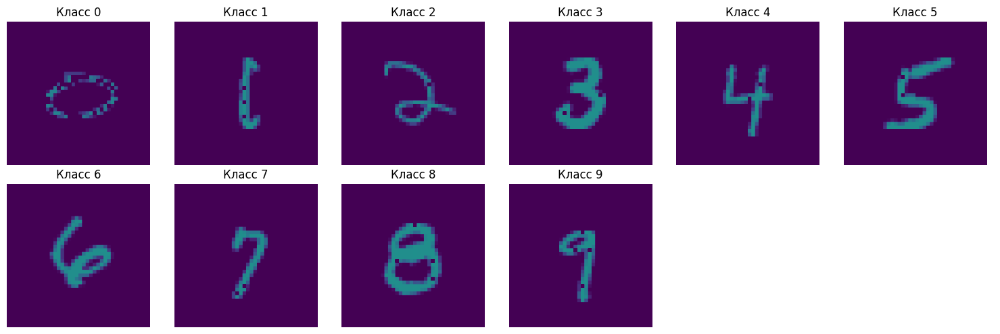

In [13]:
def decode_label(one_hot):
    return tf.argmax(one_hot).numpy()

examples = {}

for image_batch, label_batch in train_dataset.unbatch():
    label_idx = decode_label(label_batch)
    if label_idx not in examples:
        examples[label_idx] = image_batch
    if len(examples) == num_classes:
        break

data = []
for label, image in sorted(examples.items()):
    phase = np.angle(image.numpy().squeeze())
    data.append({
        "Лейбл": label,
        "Изображение": phase
    })

df = pd.DataFrame(data)

cols = 6
rows = int(np.ceil(len(df) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(2.5*cols, 2.5*rows))

for i, (idx, row) in enumerate(df.iterrows()):
    ax = axes[i // cols, i % cols]
    ax.imshow(row["Изображение"], cmap='viridis', vmin=0, vmax=2*np.pi)
    ax.set_title(f"Класс {row['Лейбл']}")
    ax.axis("off")

for j in range(i + 1, rows * cols):
    axes[j // cols, j % cols].axis('off')

plt.tight_layout()
plt.show()

Получаем такой результат:

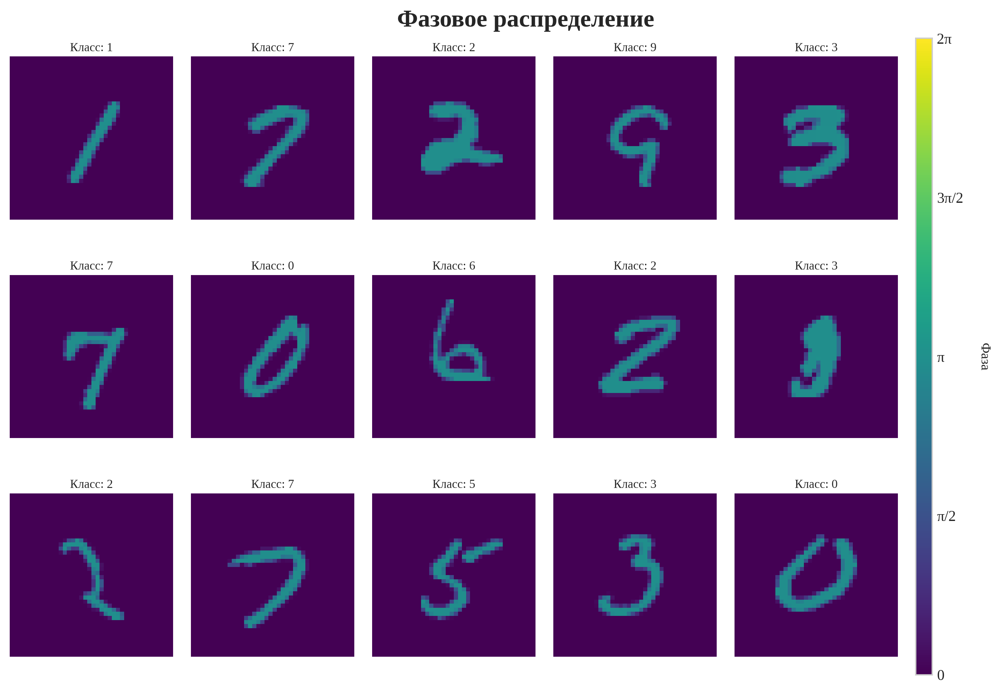

In [14]:
class_num_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
class_names = class_num_names
visualize_phase_distribution(train_dataset.shuffle(30),
                            class_names,
                            rows=3,
                            cols=5,
                            save_path='phase_distribution.png')

#### Дополнительно

Можно обучаться не на цифрах MNIST, а на буквах, код ниже сделан для визуализации надписей

In [15]:
target_labels = [13, 6, 20, 9, 16, 11, 18, 19, 21, 15, 26, 22]
num_classes = len(target_labels) ## ДЛЯ PREPROCESS
class_names = [string.ascii_uppercase[i - 1] for i in target_labels]
print(class_names)

['M', 'F', 'T', 'I', 'P', 'K', 'R', 'S', 'U', 'O', 'Z', 'V']


In [16]:
label_map = {orig: i for i, orig in enumerate(target_labels)}

keys_tensor = tf.constant(target_labels, dtype=tf.int64)
vals_tensor = tf.range(len(target_labels), dtype=tf.int64)

label_table = tf.lookup.StaticHashTable(
    tf.lookup.KeyValueTensorInitializer(keys_tensor, vals_tensor),
    default_value=-1
)

def filter_and_remap(image, label):
    new_label = label_table.lookup(tf.cast(label, tf.int64))
    keep = tf.not_equal(new_label, -1)
    return keep

def remap_label(image, label):
    new_label = label_table.lookup(tf.cast(label, tf.int64))
    return image, new_label

filtered_train = mnist_train.filter(filter_and_remap).map(remap_label)
filtered_test = mnist_test.filter(filter_and_remap).map(remap_label)

f_train_dataset = (
    filtered_train
    .map(preprocess)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

f_test_dataset = (
    filtered_test
    .map(preprocess)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

In [17]:
f_train_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 200, 200, 1), dtype=tf.complex64, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>

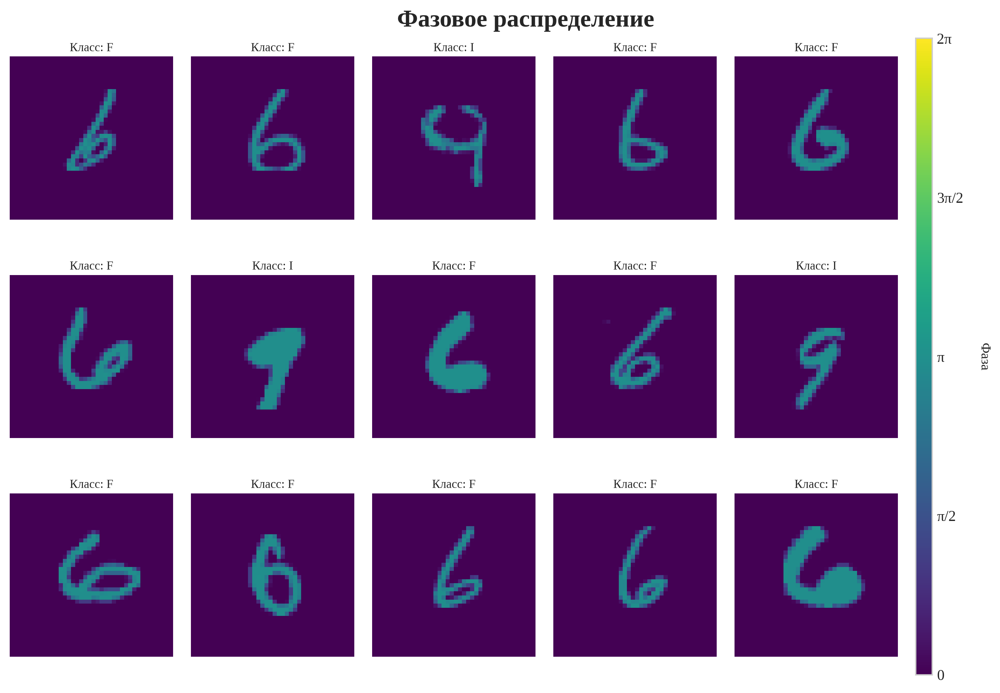

In [18]:
visualize_phase_distribution(f_train_dataset.shuffle(30),
                            class_names,
                            rows=3,
                            cols=5,
                            save_path='phase_distribution_f.png')

Для цифр **MNIST**:

In [19]:
f_train_dataset = train_dataset
f_test_dataset = test_dataset
num_classes = 10

# 2. Инициализация масок Gerchberg-Saxton

Инициализировать каждую фазовую маску $\phi_m (x,y)$ так, чтобы:
- Плоская волна, модулированная маской и распространённая на расстояние z
- **Фокусировалась в центр** (максимум интенсивности в центре экрана)

**Физический смысл:**
- Первая маска создает "линзу" для начальной фокусировки
- Последующие маски уточняют фокусировку и начинают разделять информацию по регионам
- Финальные маски разделяют энергию по 10 классам

$$
\begin{align}
\text{Итерация } k: \\
\quad & A^{(k)} = |A_{in}| \cdot e^{i\varphi_k(x,y)} \\
\quad & B^{(k)} = \text{ASP}[A^{(k)}, +z] \quad \text{(распространение вперед)} \\
\quad & \tilde{B}^{(k)} = |A_{out,target}| \cdot e^{i \arg(B^{(k)})} \quad \text{(заменить амплитуду)} \\
\quad & \tilde{A}^{(k)} = \text{ASP}^{-1}[\tilde{B}^{(k)}, -z] \quad \text{(распространение назад)} \\
\quad & \varphi_{k+1} = \arg(\tilde{A}^{(k)}) \quad \text{(обновить маску)}
\end{align}
$$

где:
- **ASM** — Angular Spectrum Propagation (распространение в области Френеля через FFT)

In [20]:
class GSFocusingInitializer:
    """
    Алгоритм Gerchberg-Saxton для инициализации фазовых масок.
    
    Восстанавливает фазовую маску φ(x,y), которая модулирует плоскую волну
    и создает целевое распределение интенсивности после распространения на расстояние z.
    
    Поддерживает произвольные целевые распределения и сохранение полной истории оптимизации.
    """
    
    def __init__(self, units=200, dx=100e-6, lam=0.75e-3, z=3e-2, 
                 focus_sigma=20, num_iterations=20, convergence_threshold=1e-4):
        """
        Args:
            units: Размер поля Nx × Nx (пиксели)
            dx: Размер пикселя (м)
            lam: Длина волны (м)
            z: Расстояние распространения (м)
            focus_sigma: Ширина целевого гауссиана (для default target)
            num_iterations: Максимум итераций
            convergence_threshold: Порог сходимости
        """
        self.Nx = units
        self.dx = tf.constant(dx, dtype=tf.float32)
        self.lam = tf.constant(lam, dtype=tf.float32)
        self.z = tf.constant(z, dtype=tf.float32)
        self.k = tf.constant(2.0 * np.pi / lam, dtype=tf.float32)
        self.focus_sigma = focus_sigma
        self.num_iter = num_iterations
        self.conv_threshold = convergence_threshold
        
        # Целевое распределение
        self.target = None
        self.target_intensity = None
        
        # История оптимизации
        self.history = None
    
    def set_target(self, target):
        """
        Установить целевое распределение интенсивности.
        
        Args:
            target: numpy array shape (Nx, Nx) или None для гауссиана
        """
        if target is None:
            target = self._create_default_gaussian()
        else:
            target = np.asarray(target, dtype=np.float32)
            if target.shape != (self.Nx, self.Nx):
                raise ValueError(f"Target должен быть размера ({self.Nx}, {self.Nx}), получен {target.shape}")
            target = target / (np.max(target) + 1e-10)
        
        self.target = target
        self.target_intensity = tf.constant(target, dtype=tf.complex64)
    
    def _create_default_gaussian(self):
        """Целевой гауссиан по умолчанию."""
        x = np.arange(self.Nx) - self.Nx // 2
        xx, yy = np.meshgrid(x, x)
        r_sq = xx**2 + yy**2
        gaussian = np.exp(-r_sq / (2 * self.focus_sigma**2))
        return gaussian / np.max(gaussian)
    
    def _angular_spectrum_prop(self, E, direction=1):
        """Распространение поля методом углового спектра (только распространяющиеся волны)."""
        E_fft = tf.signal.fft2d(E)
        E_fft = tf.signal.fftshift(E_fft)
        
        fx = tf.linspace(-0.5 / self.dx, 0.5 / self.dx, self.Nx)
        fxx, fyy = tf.meshgrid(fx, fx)
        fxx = tf.cast(fxx, tf.float32)
        fyy = tf.cast(fyy, tf.float32)
        
        k_rho_sq = tf.square(2.0 * np.pi * fxx) + tf.square(2.0 * np.pi * fyy)
        
        # Маска: только распространяющиеся волны
        mask = tf.cast(k_rho_sq <= tf.square(self.k), tf.complex64)
        
        kz = tf.sqrt(tf.maximum(tf.square(self.k) - k_rho_sq, 0.0))
        kz_complex = tf.cast(kz, tf.complex64)
        
        H = tf.exp(1j * kz_complex * tf.cast(direction * self.z, tf.complex64))
        E_fft_prop = E_fft * H * mask
        propagated = tf.signal.ifft2d(tf.signal.ifftshift(E_fft_prop))
        
        return propagated
    
    def compute_focusing_phase_mask(self, target=None, verbose=True, save_history=True):
        """
        Итеративная оптимизация фазовой маски Gerchberg-Saxton.
        
        Args:
            target: Целевое распределение (numpy array) или None для гауссиана
            verbose: Выводить информацию о ходе выполнения
            save_history: Сохранять ли полную историю (фазы, интенсивности)
        
        Returns:
            phase_mask: Оптимизированная фазовая маска shape (Nx, Nx)
            errors: Ошибка на каждой итерации
        """
        if target is not None:
            self.set_target(target)
        elif self.target is None:
            self.set_target(None)
        
        # Инициализировать историю
        self.history = {
            'errors': [],
            'phases': [] if save_history else None,
            'intensities': [] if save_history else None,
            'output_phases': [] if save_history else None,
            'desired_fields': [] if save_history else None,
            'iterations': []
        }
        
        input_field = tf.ones((self.Nx, self.Nx), dtype=tf.complex64)
        phase = tf.Variable(
            tf.random.uniform((self.Nx, self.Nx), 0, 2*np.pi),
            dtype=tf.float32,
            trainable=False
        )
        
        if verbose:
            print(f"Gerchberg-Saxton инициализация")
            print(f"Поле: {self.Nx}×{self.Nx}, z={self.z.numpy()*100:.1f}cm, λ={self.lam.numpy()*1e9:.0f}nm\n")
        pbar = tqdm(range(self.num_iter), desc='G-S алгоритм')
        
        for iteration in pbar:
            # Шаг 1: Модулировать плоскую волну маской
            phase_mod = tf.exp(1j * tf.cast(phase, tf.complex64))
            modulated = input_field * phase_mod
            
            # Шаг 2: Распространить вперед на расстояние z
            propagated = self._angular_spectrum_prop(modulated, direction=1)
            
            # Шаг 3: Заменить амплитуду на целевую, сохранить фазу
            current_amplitude = tf.abs(propagated)
            current_phase = tf.math.angle(propagated)
            phase_complex = tf.cast(current_phase, tf.complex64)
            desired_field = self.target_intensity * tf.exp(1j * phase_complex)
            
            # Шаг 4: Распространить обратно на -z
            back_propagated = self._angular_spectrum_prop(desired_field, direction=-1)
            
            # Шаг 5: Обновить фазовую маску
            new_phase = tf.math.angle(back_propagated)
            phase.assign(new_phase)
            
            # Вычислить ошибку и сохранить историю
            error = tf.reduce_mean(tf.square(current_amplitude - tf.abs(self.target_intensity)))
            error_val = error.numpy()
            self.history['errors'].append(error_val)
            
            if save_history:
                self.history['phases'].append(phase.numpy().copy())  # Фаза маски
                self.history['intensities'].append(current_amplitude.numpy().copy())  # Амплитуда в фокусе
                self.history['output_phases'].append(current_phase.numpy().copy())  # Фаза в фокусе
                self.history['iterations'].append(iteration)
                self.history['desired_fields'].append(desired_field.numpy().copy())
            
            pbar.set_postfix({'error': f'{error_val:.3e}'})
            
            if error_val < self.conv_threshold and iteration > 2:
                if verbose:
                    print(f"✓ Сходимость за {iteration+1} итераций\n")
                break
        
        return phase.numpy(), np.array(self.history['errors'])

    
    def get_history(self):
        """Получить полную историю оптимизации."""
        if self.history is None:
            raise RuntimeError("История не доступна. Сначала запустите compute_focusing_phase_mask()")
        return self.history
    
    def get_history_frame(self, iteration):
        """Получить состояние алгоритма на конкретной итерации"""
        if self.history is None or not self.history['phases']:
            raise RuntimeError("История не доступна")
        
        if iteration >= len(self.history['phases']):
            raise IndexError(f"Итерация {iteration} вне диапазона")
        
        return {
            'iteration': self.history['iterations'][iteration],
            'input_phase': self.history['phases'][iteration],
            'output_amplitude': self.history['intensities'][iteration],
            'output_phase': self.history['output_phases'][iteration],
            'desired_field': self.history['desired_fields'][iteration],  
            'error': self.history['errors'][self.history['iterations'][iteration]]
        }
    
    def get_target(self):
        """Получить текущее целевое распределение."""
        return self.target

Функция для преобразования изображения в таргет:

In [23]:
def load_image_as_target(image_path, Nx=200, threshold=None):
    """
    Загрузить изображение и преобразовать в целевое распределение.
    
    Args:
        image_path: Путь к файлу изображения
        Nx: Размер выходного массива (Nx, Nx)
        threshold: Порог для бинаризации (0-1) или None для использования интенсивности
    
    Returns:
        numpy array shape (Nx, Nx) - целевое распределение
    """
    img = Image.open(image_path)

    img_gray = img.convert('L')

    img_resized = img_gray.resize((Nx, Nx), Image.LANCZOS)

    img_array = np.array(img_resized, dtype=np.float32) / 255.0
    
    if np.mean(img_array) > 0.5:
        img_array = 1.0 - img_array
    
    # Бинаризация (опционально)
    if threshold is not None:
        img_array = np.where(img_array > threshold, 1.0, 0.0)
    
    # Нормализовать
    img_array = img_array / (np.max(img_array) + 1e-10)
    
    return img_array


def visualize_target_image(target):
    
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(target, cmap='hot', extent=[-1, 1, -1, 1])
    ax.set_title('Загруженный таргет', fontsize=12, fontweight='bold')
    ax.set_xlabel('x (норм.)')
    ax.set_ylabel('y (норм.)')
    plt.colorbar(ax.images[0], ax=ax, label='Интенсивность')
    return fig


def gaussian(Nx, sigma=None):
    """Гауссиан."""
    if sigma is None:
        sigma = Nx // 10
    x = np.arange(Nx) - Nx // 2
    xx, yy = np.meshgrid(x, x)
    gaussian = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    return gaussian / np.max(gaussian)

Посмотрим на различные маски:

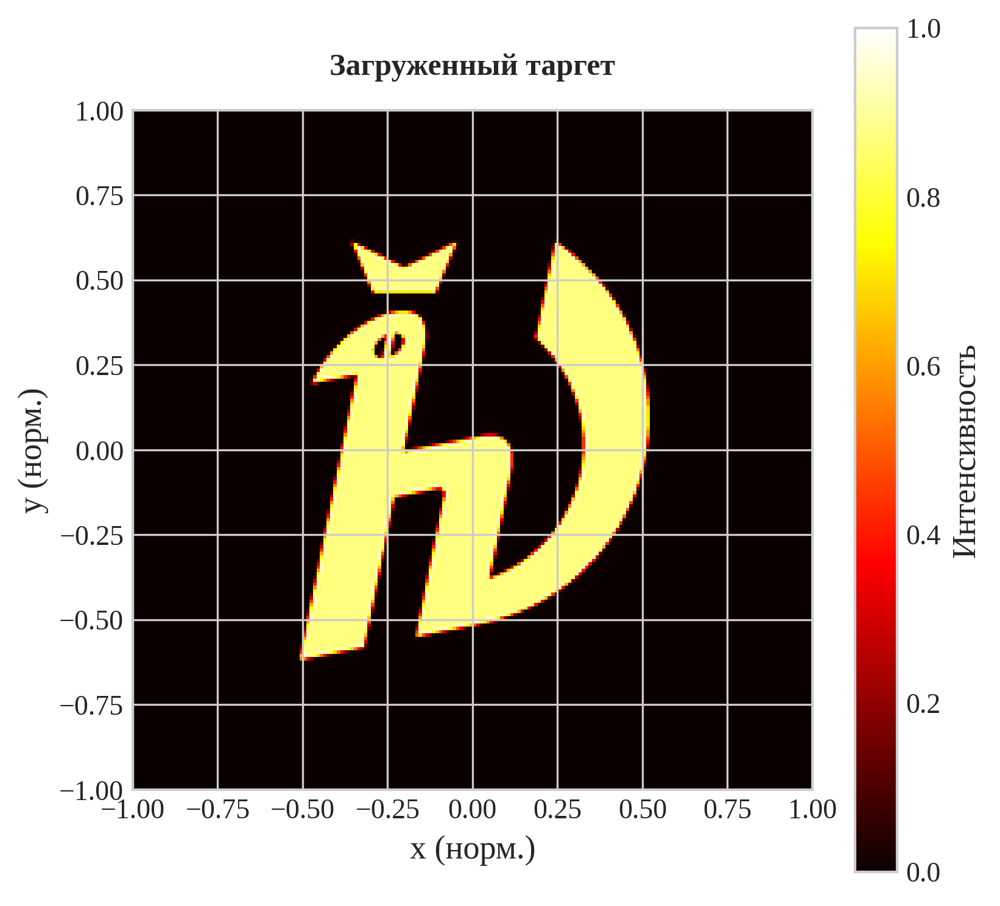

In [19]:
mipt_target = load_image_as_target('/kaggle/input/mipt-logo/MIPT_LOGO.png')
fig = visualize_target_image(mipt_target)
fig.show()

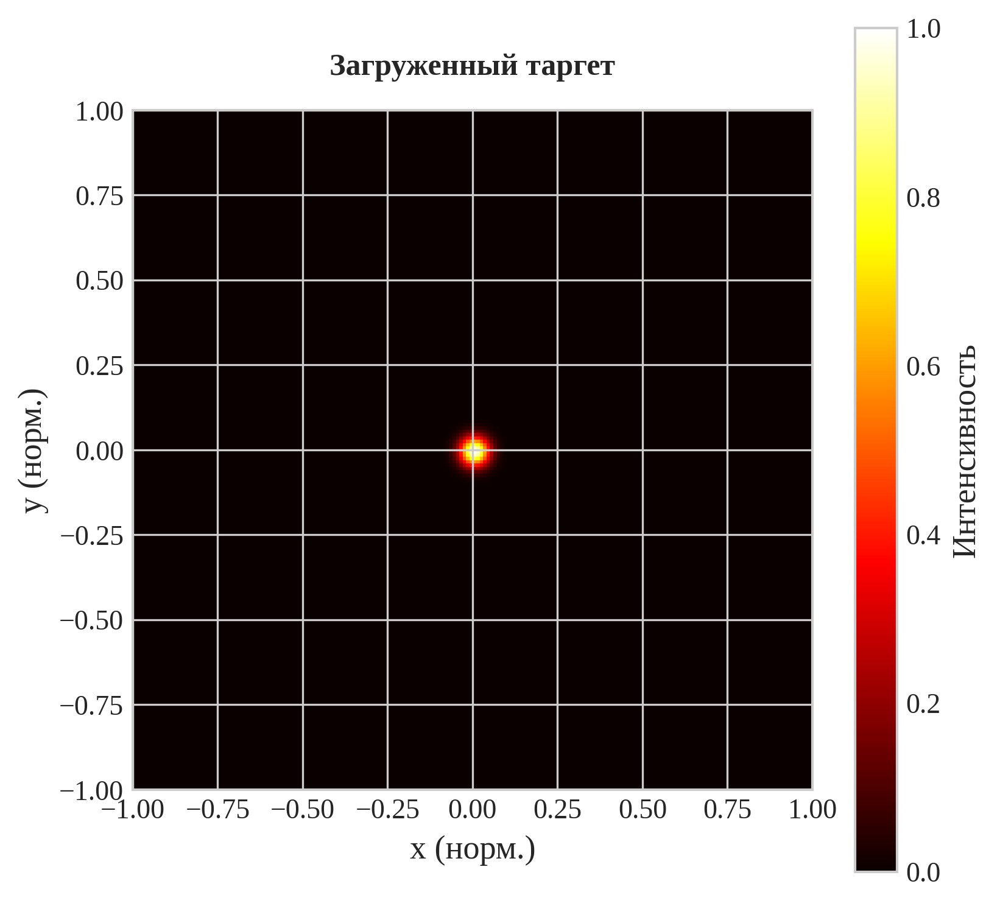

In [24]:
small_gaussian = gaussian(200, 3)
fig = visualize_target_image(small_gaussian)
fig.show()

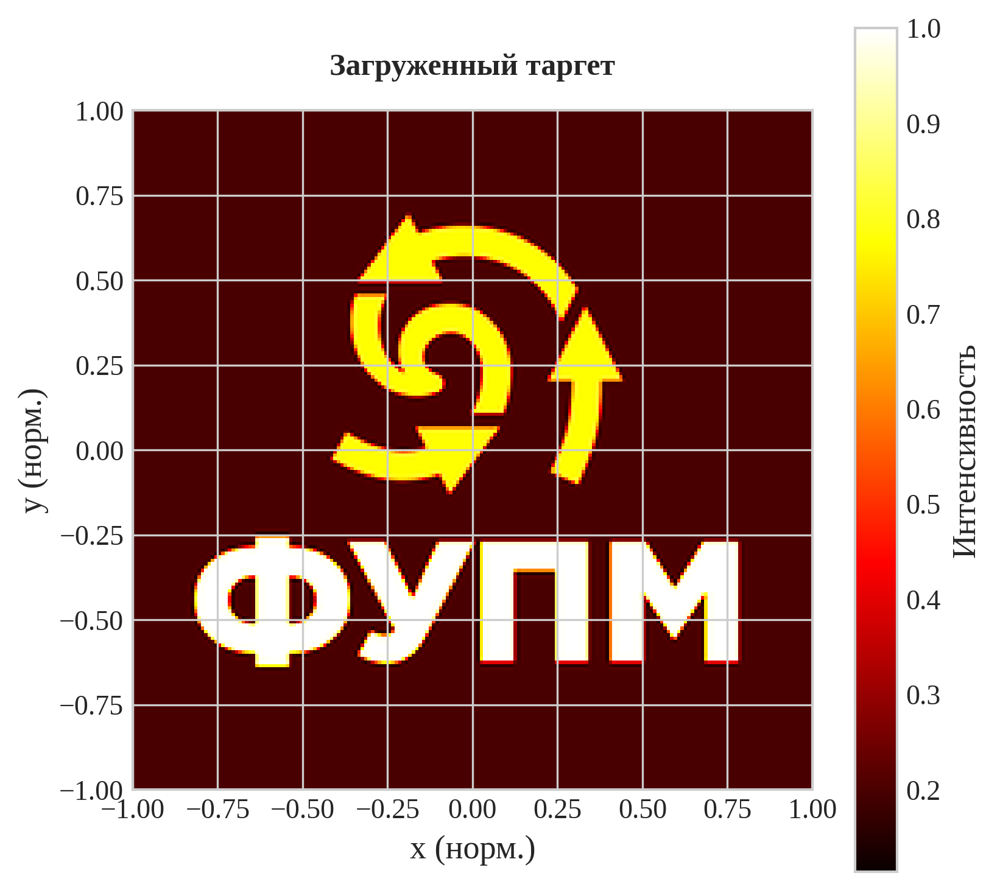

In [21]:
fupm_target = load_image_as_target('/kaggle/input/fupm-logo/FUPM.png')
fig = visualize_target_image(fupm_target)
fig.show()

Функции для визуализации экспериментов:

In [22]:
def visualize_focusing_results(gs_init, phase_mask, errors):
    """
    Визуализация результатов инициализации Gerchberg-Saxton.
    Отображает: целевую интенсивность, полученную интенсивность и фазовую маску.
    """
    # Вычислить интенсивность в фокусе с полученной маской
    input_field = tf.ones((gs_init.Nx, gs_init.Nx), dtype=tf.complex64)
    phase_mod = tf.exp(1j * tf.cast(phase_mask, tf.complex64))
    modulated = input_field * phase_mod
    propagated = gs_init._angular_spectrum_prop(modulated, direction=1)
    obtained_intensity = np.abs(propagated.numpy())
    
    # Целевая интенсивность
    target_intensity = gs_init.target_intensity
    target_intensity_np = np.abs(target_intensity)
    
    # Создать фигуру 1x3
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    fig.suptitle('Инициализация фазовой маски (Gerchberg-Saxton)', fontsize=14, fontweight='bold')
    
    # 1. Целевое распределение
    im1 = axes[0].imshow(target_intensity_np, cmap='hot', extent=[-1, 1, -1, 1])
    axes[0].set_title('Целевая интенсивность', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('x (норм.)')
    axes[0].set_ylabel('y (норм.)')
    plt.colorbar(im1, ax=axes[0], label='Интенсивность')
    
    # 2. Полученное распределение
    im2 = axes[1].imshow(obtained_intensity, cmap='hot', extent=[-1, 1, -1, 1])
    axes[1].set_title('Полученная интенсивность', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('x (норм.)')
    axes[1].set_ylabel('y (норм.)')
    plt.colorbar(im2, ax=axes[1], label='Интенсивность')
    
    # 3. Фазовая маска с диапазоном [-π, π]
    im0 = axes[2].imshow(phase_mask, cmap='hsv', extent=[-1, 1, -1, 1], vmin=-np.pi, vmax=np.pi)
    axes[2].set_title('Фазовая маска φ(x,y)', fontsize=12, fontweight='bold')
    axes[2].set_xlabel('x (норм.)')
    axes[2].set_ylabel('y (норм.)')
    cbar0 = plt.colorbar(im0, ax=axes[2], label='Фаза (рад)')
    cbar0.set_ticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
    cbar0.set_ticklabels(['-π', '-π/2', '0', 'π/2', 'π'])
    
    plt.tight_layout()
    return fig

Визуализация истории:

In [23]:
def phase_amplitude_to_rgb(phase, amplitude):
    """
    Преобразовать фазу и амплитуду в RGB (HSV представление).
    
    Амплитуда = яркость (Value)
    Фаза = цвет (Hue)
    """
    # Нормализовать амплитуду
    amp_norm = amplitude / (np.max(amplitude) + 1e-10)
    
    hsv = np.stack([
        (phase + np.pi) / (2 * np.pi), 
        np.ones_like(phase), 
        amp_norm
    ], axis=-1)
    
    rgb = hsv_to_rgb(hsv)
    return rgb


def visualize_frame(gs_init, epoch):
    """Визуализировать одну итерацию."""
    frame = gs_init.get_history_frame(epoch)
    
    output_amplitude = frame['output_amplitude']
    output_phase = frame['output_phase']
    desired_field = frame['desired_field']
    error = frame['error']
    iteration = frame['iteration']
    
    fft_amplitude = np.abs(desired_field)
    fft_phase = np.angle(desired_field)
    
    fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    fig.suptitle(f'Итерация {iteration+1} | Ошибка: {error:.3e}', 
                 fontsize=14, fontweight='bold')
    
    # ============= IMAGE PLANE (Выходное поле) =============
    
    # 1. Амплитуда выхода
    im1 = axes[0, 0].imshow(output_amplitude, cmap='hot', extent=[-1, 1, -1, 1])
    axes[0, 0].set_title('Image Plane (А) \nАмплитуда', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    # 2. Фаза выхода
    im2 = axes[0, 1].imshow(output_phase, cmap='hsv', vmin=-np.pi, vmax=np.pi, 
                            extent=[-1, 1, -1, 1])
    axes[0, 1].set_title('Фаза выхода', fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')
    
    # 3. Поле выхода
    field_rgb = phase_amplitude_to_rgb(output_phase, output_amplitude)
    axes[0, 2].imshow(field_rgb, extent=[-1, 1, -1, 1])
    axes[0, 2].set_title('Поле выхода', fontsize=14, fontweight='bold')
    axes[0, 2].axis('off')
    
    # ============= FOURIER PLANE (desired_field) =============
    
    # 4. Амплитуда спектра
    fft_amp_log = np.log(fft_amplitude + 1)
    im4 = axes[1, 0].imshow(fft_amp_log, cmap='hot', extent=[-1, 1, -1, 1])
    axes[1, 0].set_title('Fourier Plane (B) \nАмплитуда спектра', fontsize=14, fontweight='bold')
    axes[1, 0].axis('off')
    
    # 5. Фаза спектра
    im5 = axes[1, 1].imshow(fft_phase, cmap='hsv', vmin=-np.pi, vmax=np.pi, 
                            extent=[-1, 1, -1, 1])
    axes[1, 1].set_title('Фаза спектра', fontsize=14, fontweight='bold')
    axes[1, 1].axis('off')
    
    # 6. Поле спектра
    fft_field_rgb = phase_amplitude_to_rgb(fft_phase, fft_amp_log)
    axes[1, 2].imshow(fft_field_rgb, extent=[-1, 1, -1, 1])
    axes[1, 2].set_title('Поле спектра', fontsize=14, fontweight='bold')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    return fig

def visualize_history(gs_init, epochs):
    for e in epochs:
        fig = visualize_frame(gs_init, e)
        fig.show()

Посмотрим на работу класса:

Gerchberg-Saxton инициализация
Поле: 200×200, z=3.0cm, λ=750000nm



G-S алгоритм:   0%|          | 0/20 [00:00<?, ?it/s]

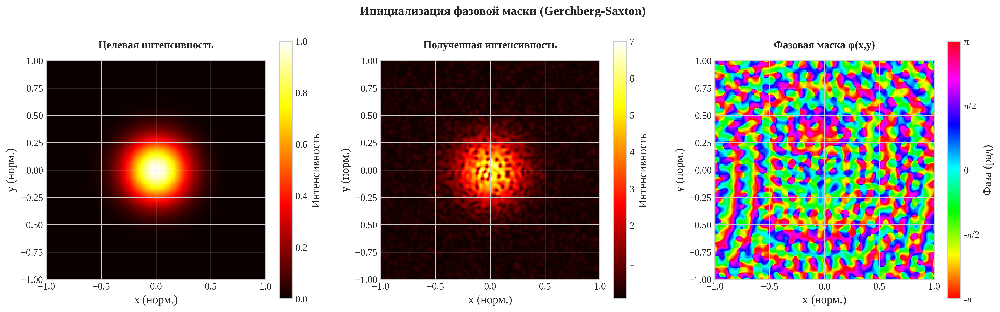

In [24]:
gs_gauss = GSFocusingInitializer()
phase_gauss, errors_gauss = gs_gauss.compute_focusing_phase_mask(verbose=True)

fig = visualize_focusing_results(gs_gauss, phase_gauss, errors_gauss)
plt.show()

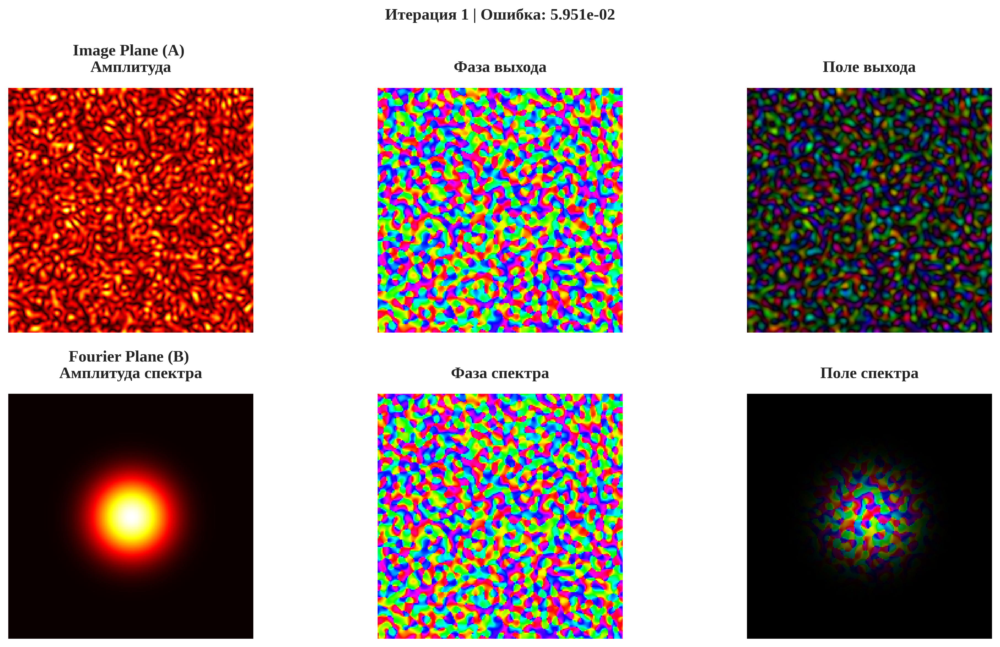

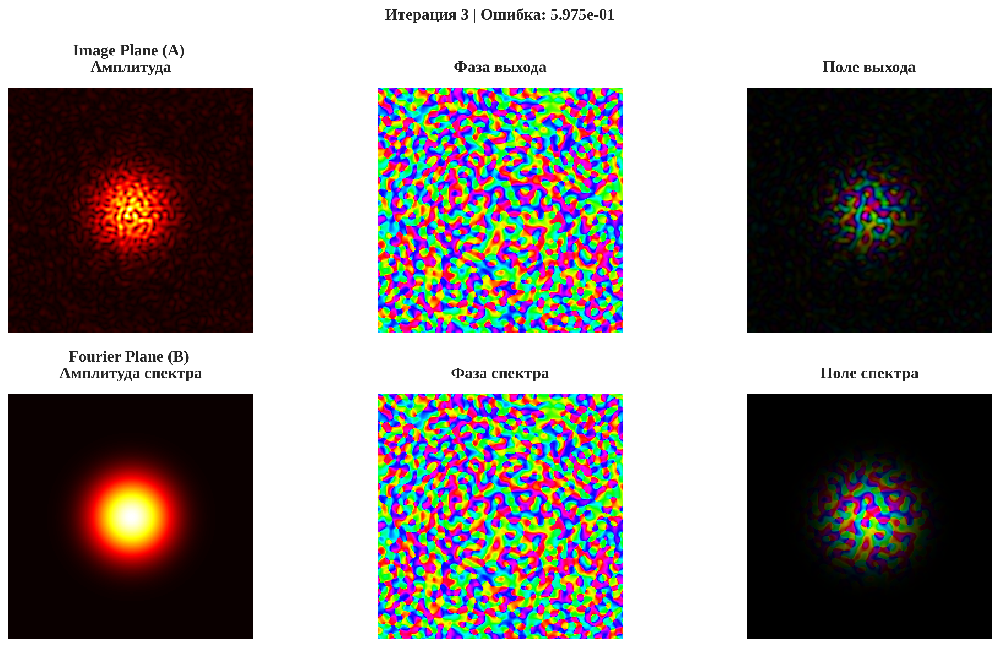

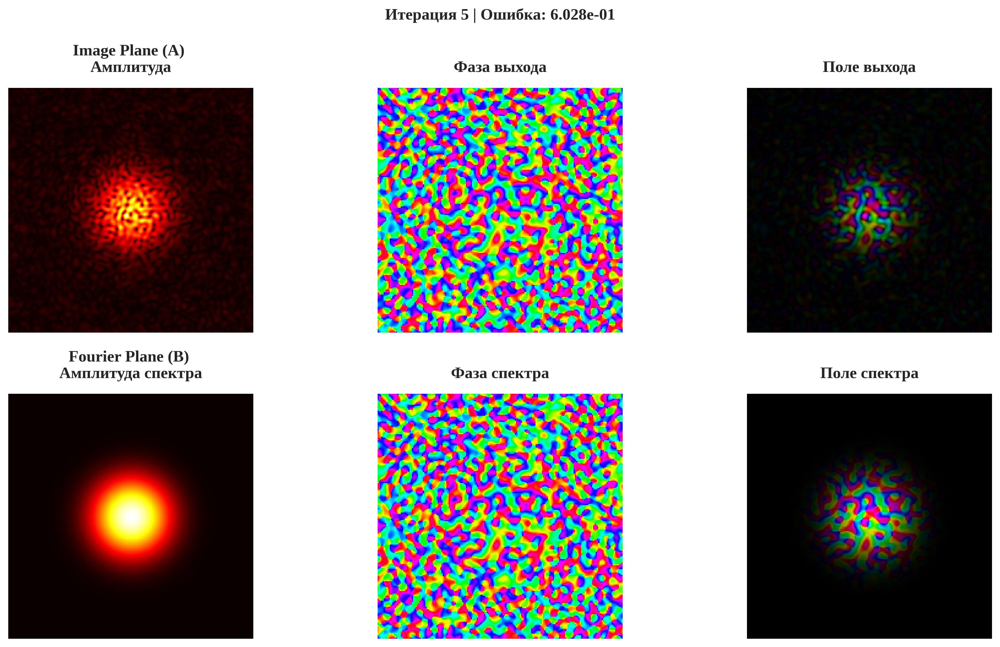

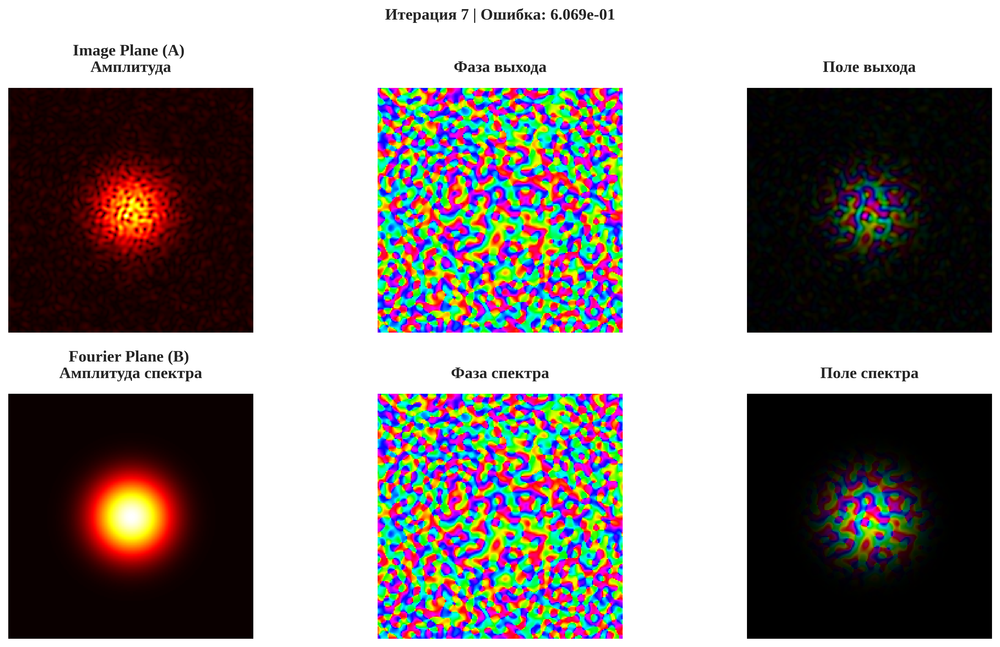

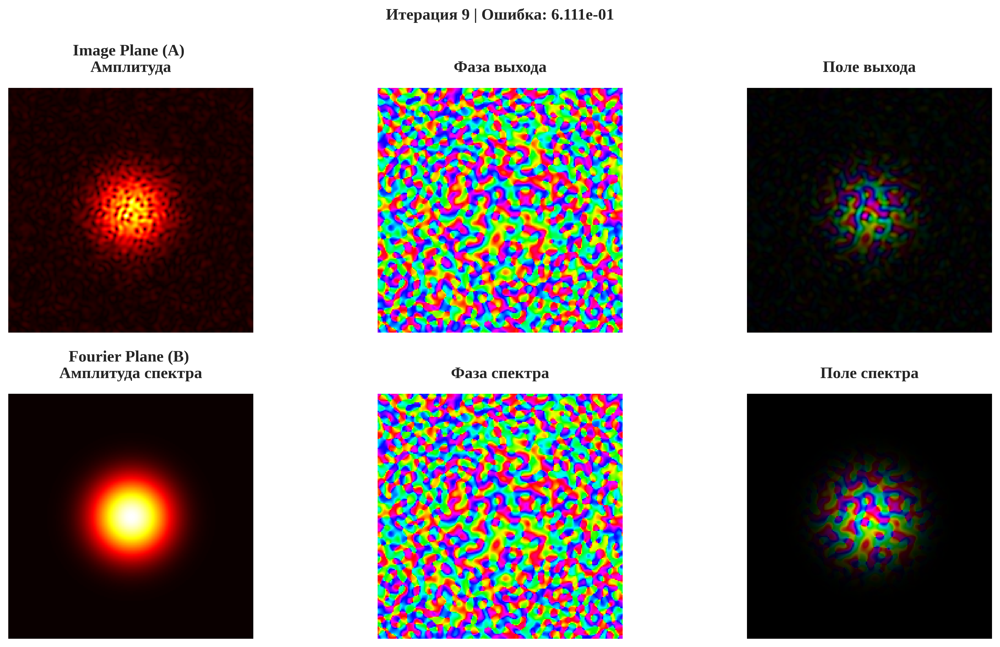

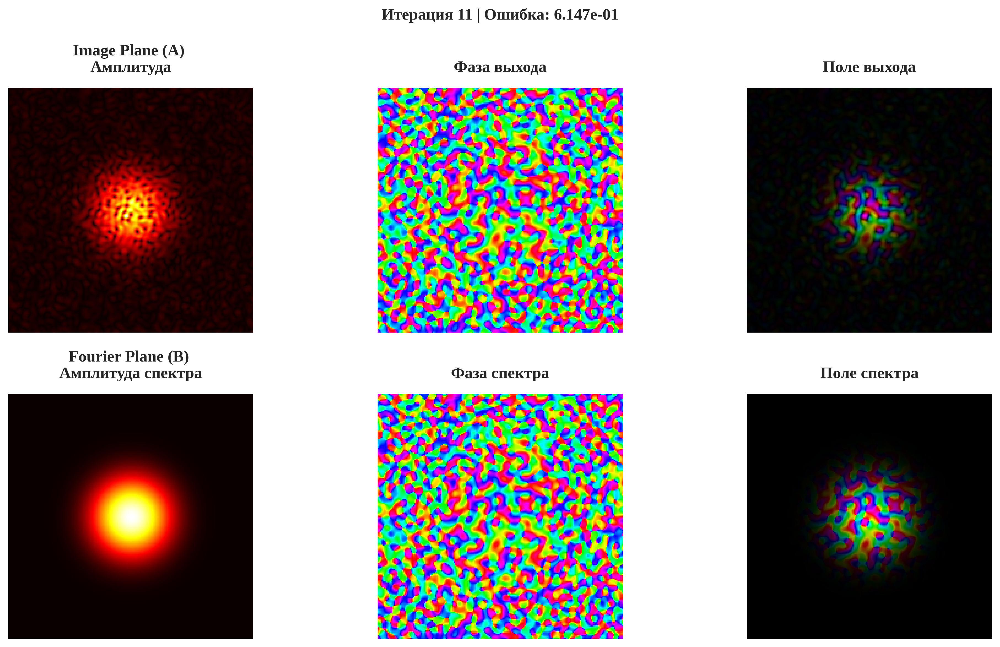

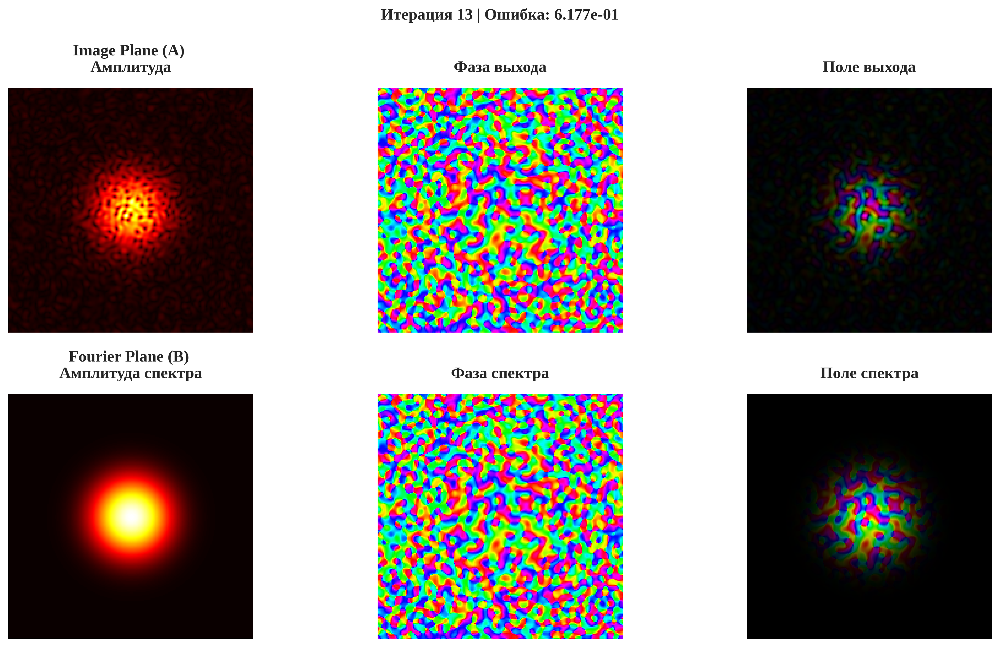

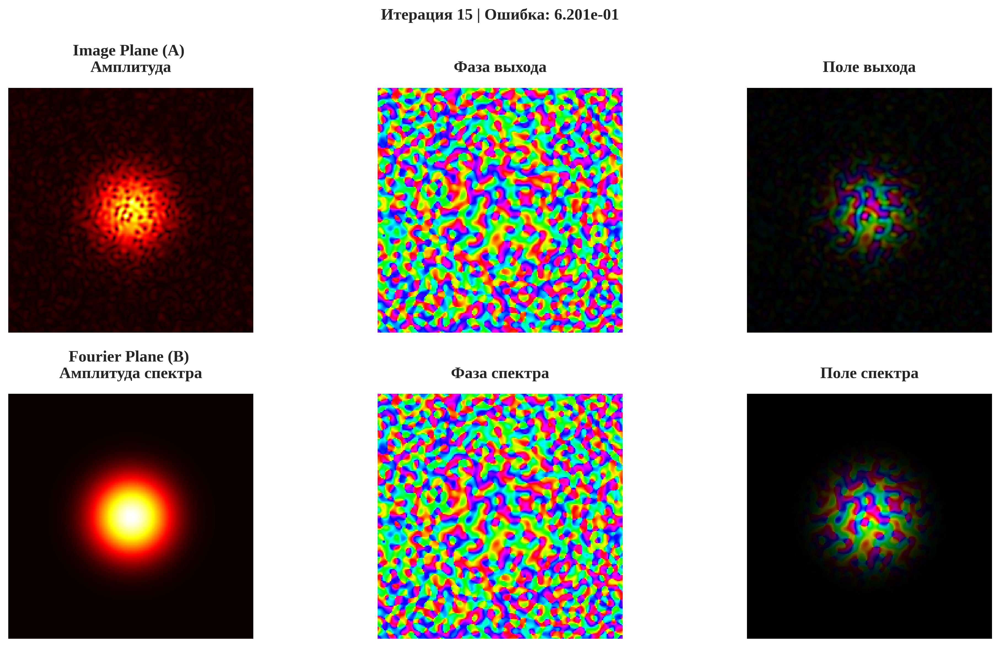

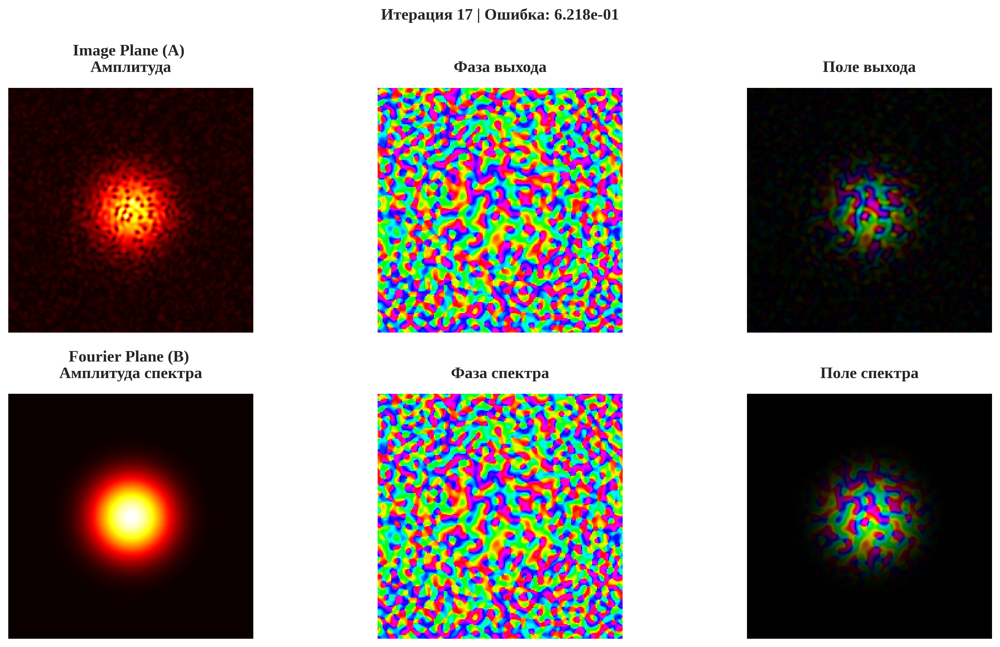

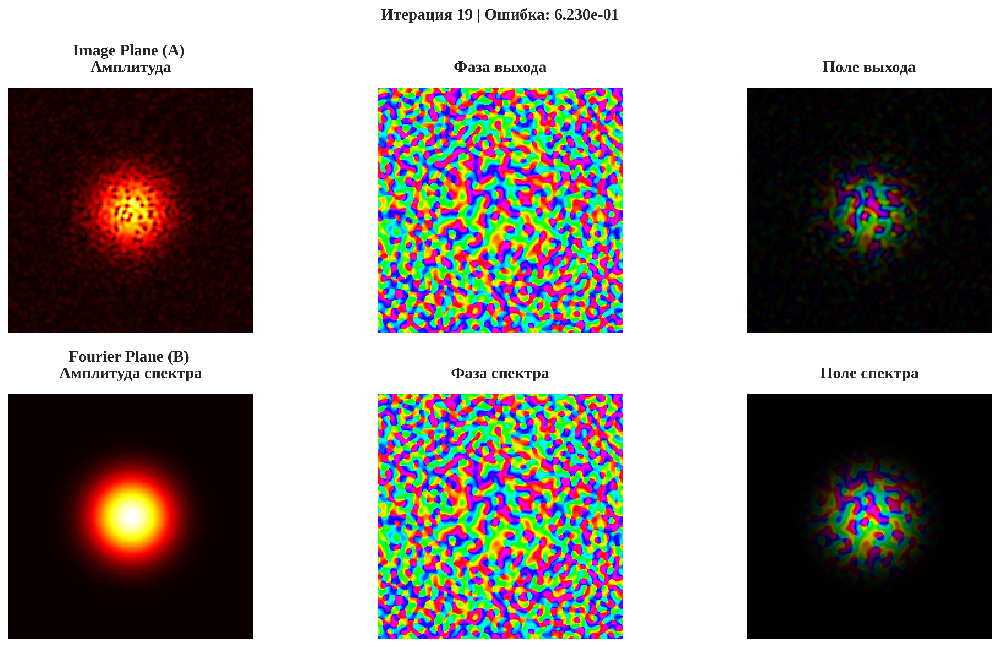

In [25]:
visualize_history(gs_gauss, epochs = range(0, 20, 2))

Фокусировка (малый гауссиан):

In [25]:
gs_focus = GSFocusingInitializer(num_iterations = 200)
gs_focus.set_target(small_gaussian)
phase_focus, errors_focus = gs_focus.compute_focusing_phase_mask(verbose=True)

fig = visualize_focusing_results(gs_focus, phase_focus, errors_focus)
plt.show()

Gerchberg-Saxton инициализация
Поле: 200×200, z=3.0cm, λ=750000nm



G-S алгоритм:   0%|          | 0/200 [00:00<?, ?it/s]

NameError: name 'visualize_focusing_results' is not defined

In [ ]:
visualize_history(gs_focus, epochs = range(0, 30, 6))

h: )

Gerchberg-Saxton инициализация
Поле: 200×200, z=3.0cm, λ=750000nm



G-S алгоритм:   0%|          | 0/200 [00:00<?, ?it/s]

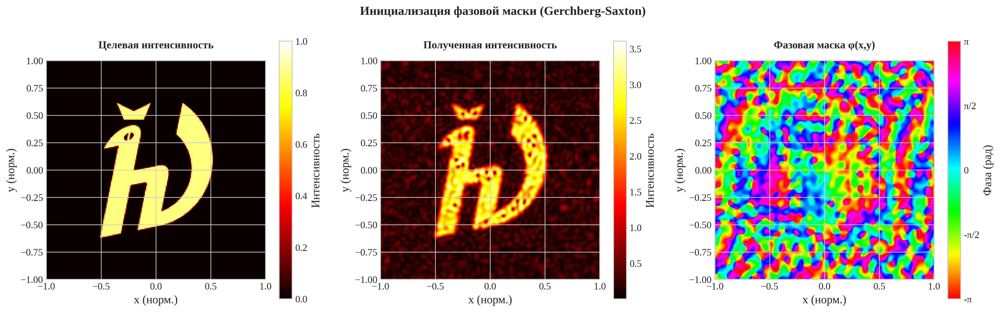

In [28]:
gs_mipt = GSFocusingInitializer(num_iterations = 200)
gs_mipt.set_target(mipt_target)
phase_mipt, errors_mipt = gs_mipt.compute_focusing_phase_mask(verbose=True)

fig = visualize_focusing_results(gs_mipt, phase_mipt, errors_mipt)
plt.show()

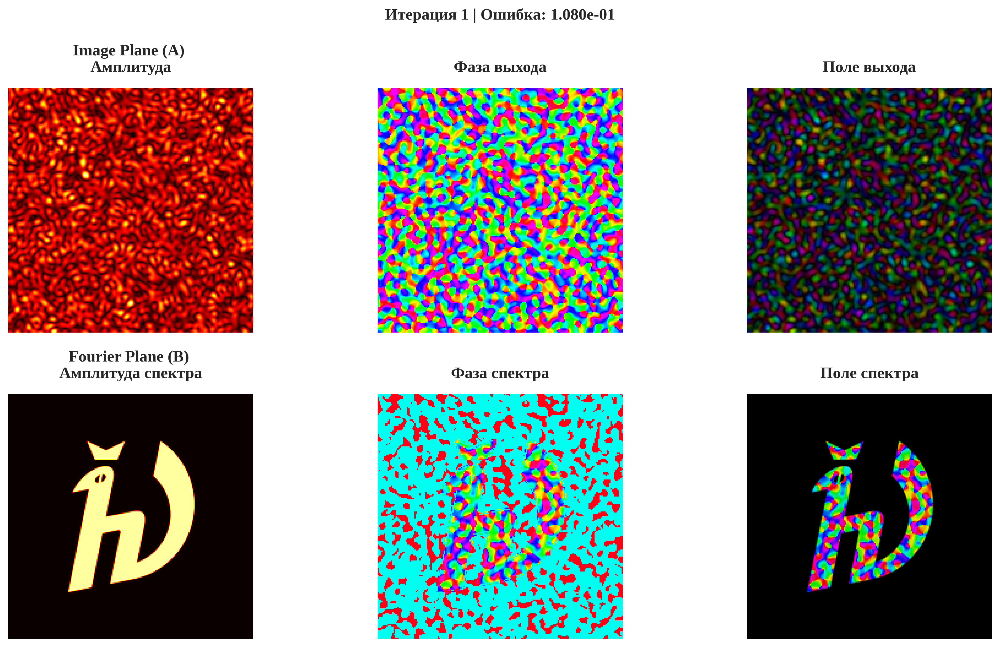

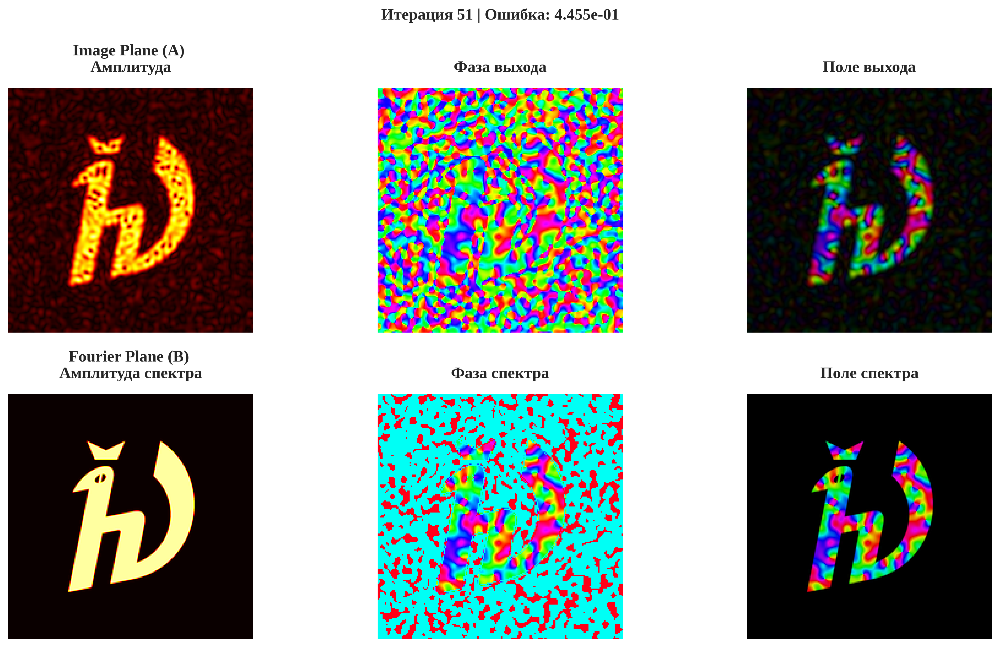

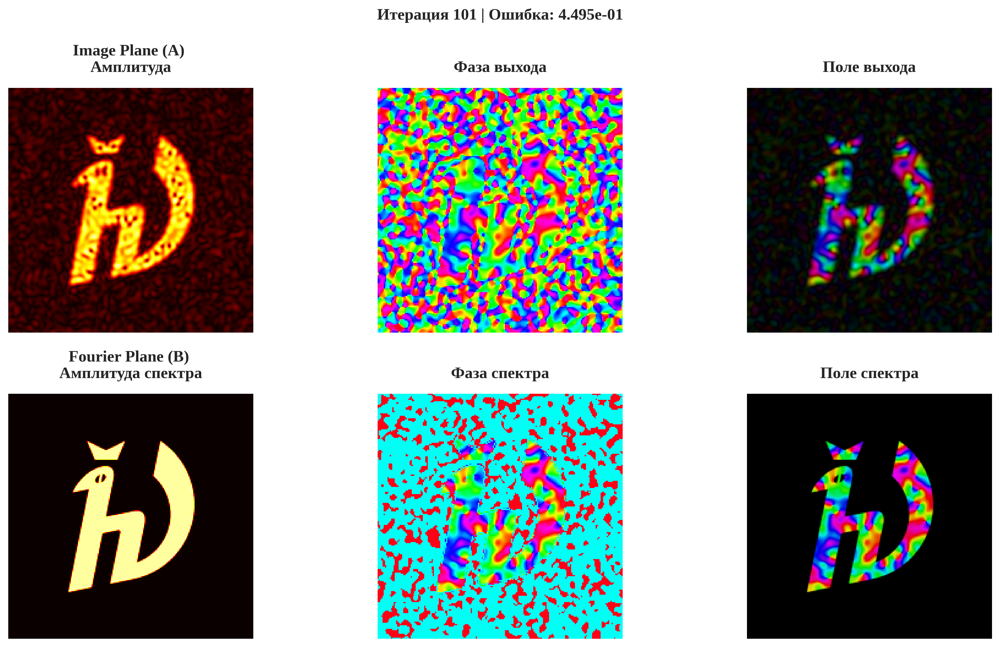

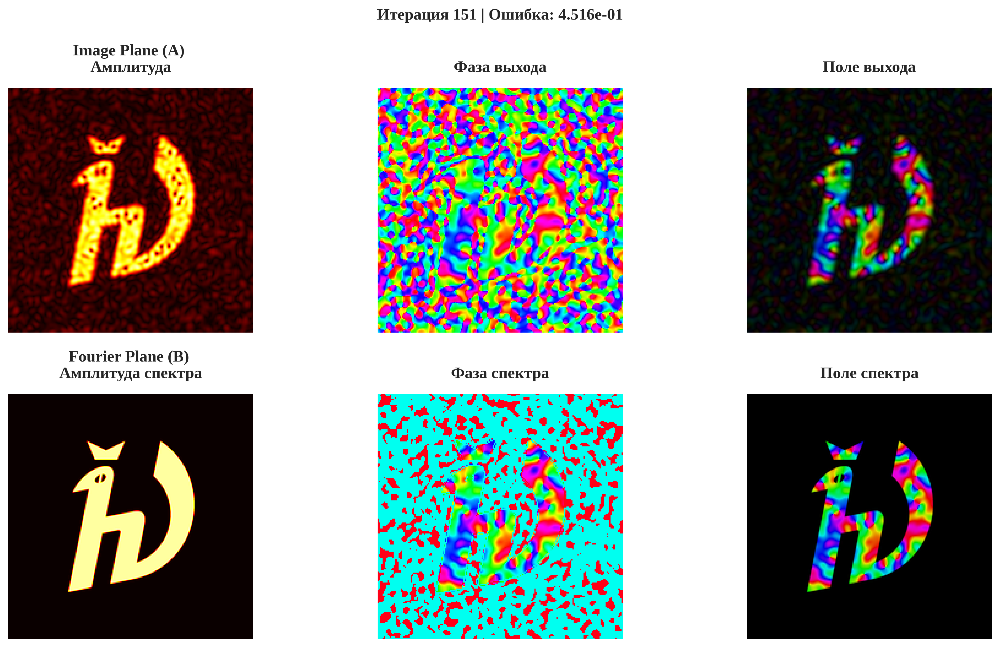

In [29]:
visualize_history(gs_mipt, epochs = range(0, 200, 50))

ФУПМ:

Gerchberg-Saxton инициализация
Поле: 200×200, z=3.0cm, λ=750000nm



G-S алгоритм:   0%|          | 0/200 [00:00<?, ?it/s]

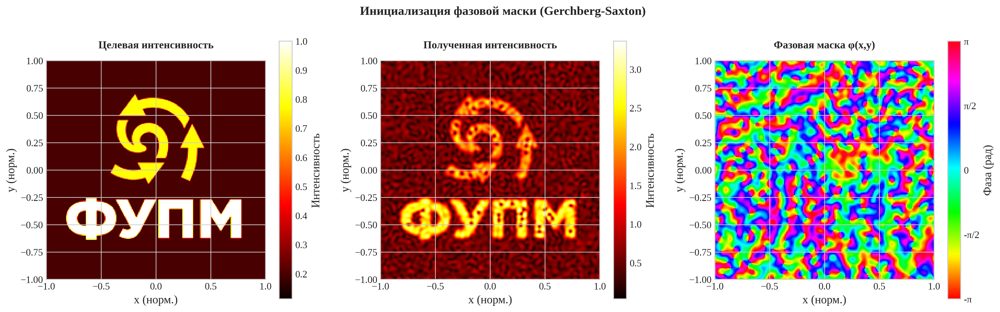

In [30]:
gs_fupm = GSFocusingInitializer(num_iterations = 200)
gs_fupm.set_target(fupm_target)
phase_fupm, errors_fupm = gs_fupm.compute_focusing_phase_mask(verbose=True)

fig = visualize_focusing_results(gs_fupm, phase_fupm, errors_fupm)
plt.show()

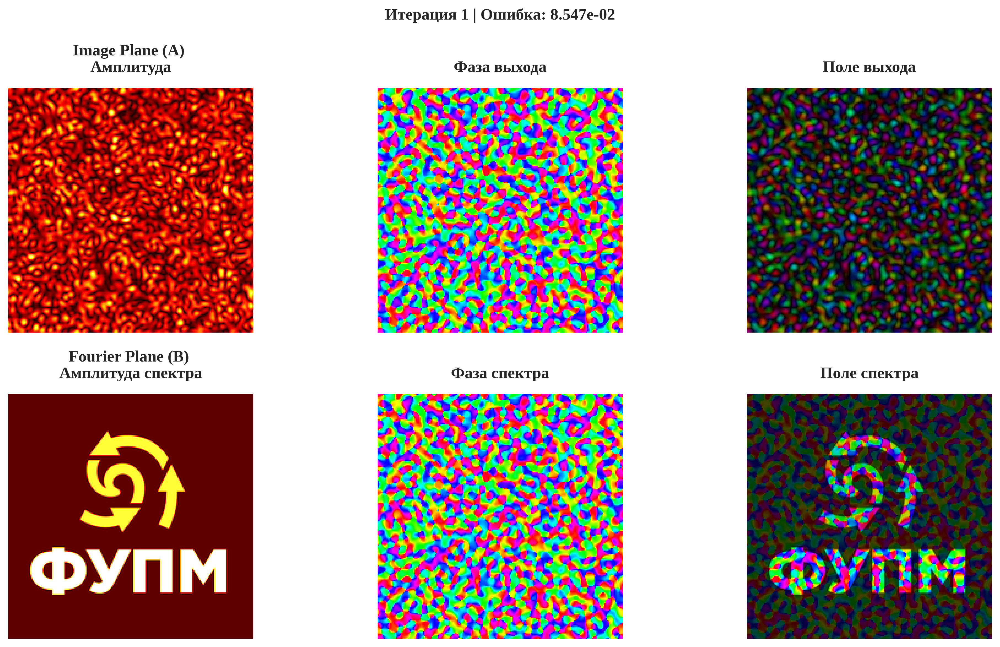

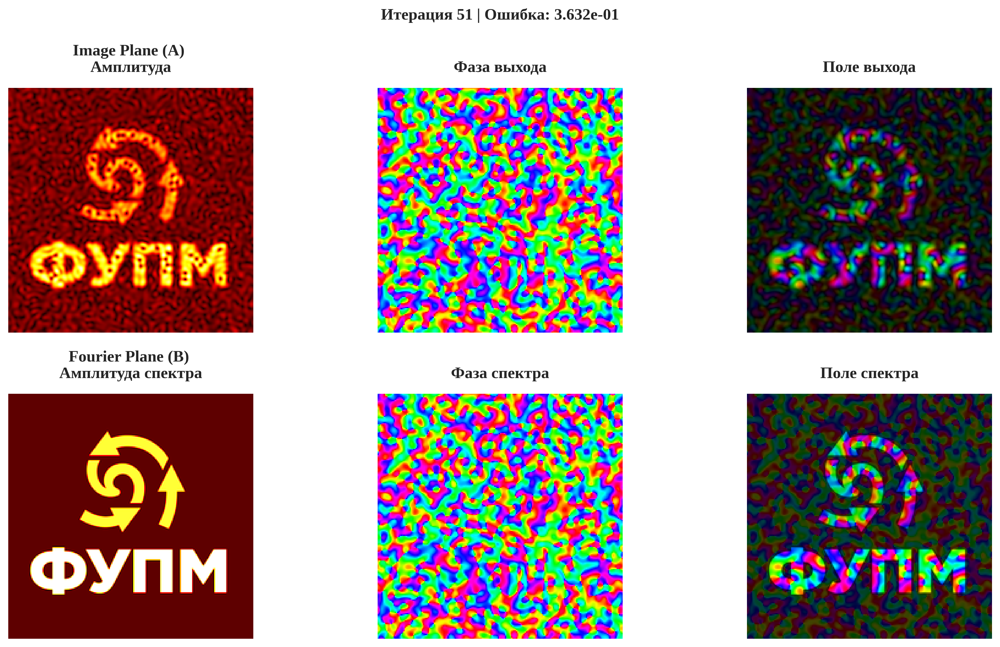

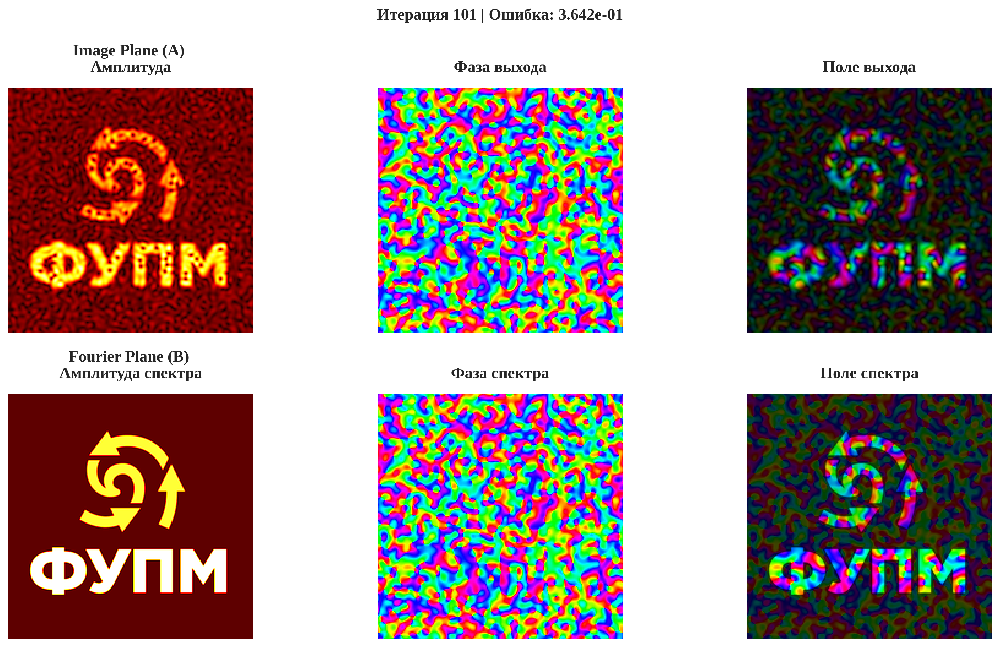

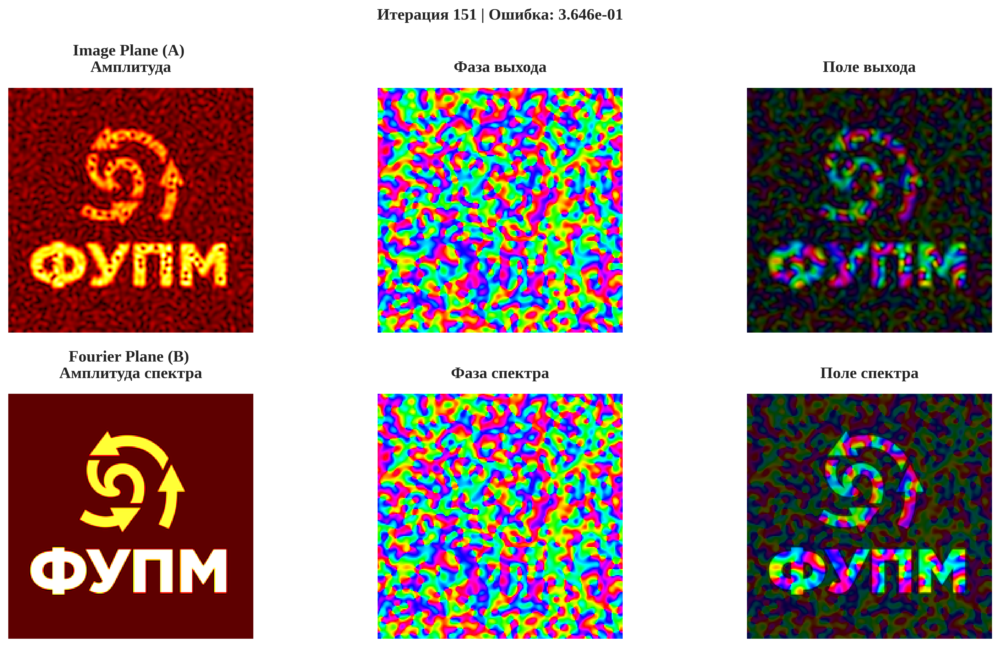

In [31]:
visualize_history(gs_fupm, epochs = range(0, 200, 50))

# 3. D2NN
## Класс дифракционной сети


Все слои работают с комплексными тензорами, представляющими оптические поля.
Основной механизм — дифракционное распространение методом углового спектра, которое реализует преобразование аналогично весам в традиционной нейросети. Фазовые маски слоев служат обучаемыми параметрами. Подробнее - в техе проекта


`ClipPhase` для обрезки фаз в решетках до $2\pi$

In [26]:
class ClipPhase(Constraint):
    """Ограничение для фазовых параметров в диапазон [0, 2π]
    """
    
    def __call__(self, w):
        """Ограничить фазовые значения к диапазону [0, 2π].
        
        Аргументы:
            w: Тензор фазовых значений.
            
        Возвращает:
            Тензор с фазовыми значениями в диапазоне [0, 2π].
        """
        return tf.math.floormod(w, 2.0 * tf.constant(np.pi))
    
    def get_config(self):
        return {}

Основной класс дифракционной сети `Diffraction_Layer`. На вход подаётся оптическое поле inputs (в виде 2D-сетки амплитуд), к нему применяется дифракционное распространение, после чего результат умножается на **фазовую маску** текущего слоя

In [27]:
class Diffraction_Layer(Layer):
    """Слой дифракционной обработки с обучаемой фазовой маской.
    
    Реализует: (1) дифракционное распространение поля методом углового спектра,
    (2) фазовую модуляцию входного поля маской текущего слоя. Фазовая маска —
    единственный обучаемый параметр слоя.
    
    Атрибуты:
        units: Размер пространственной сетки (units × units пикселей).
        dx: Размер пикселя (м), по умолчанию 100 мкм.
        lam: Длина волны света (м), по умолчанию 0.75 мм.
        z: Расстояние распространения до следующего слоя (м), по умолчанию 3 см.
    """
    
    def __init__(self, units=200, initial_phase=None):
        """Инициализация параметров слоя.
        
        Аргументы:
            units: Пространственный размер сетки (по умолчанию 200).
            initial_phase: Начальная фазовая маска (numpy array) или None для random
        """
        super().__init__()
        self.units = units
        self.Nx = units
        self.dx = tf.Variable(100e-6, dtype=tf.float32, trainable=False)
        self.lam = tf.Variable(0.75e-3, dtype=tf.float32, trainable=False)
        self.z = tf.Variable(3e-2, dtype=tf.float32, trainable=False)
        self.initial_phase = initial_phase
    
    def build(self, shape):
        """Создать обучаемую фазовую маску.
        
        Аргументы:
            shape: Форма входного тензора.
        """
        if self.initial_phase is not None:
            phase_arr = np.asarray(self.initial_phase, dtype=np.float32)
            phase_init = tf.constant_initializer(phase_arr)
        else:
             phase_init = tf.keras.initializers.RandomUniform(minval=0, maxval=2*np.pi)
            
        self.phase = self.add_weight(
            name="phase",
            shape=(self.units, self.units),
            initializer=phase_init,
            trainable=True,
            constraint=ClipPhase()
        )
    
    def angular_spectrum_propagator(self, E):
        """Дифракционное распространение методом углового спектра.
        
        Реализует решение уравнения Гельмгольца через Fourier transform:
        A(x,y,z) = IFFT{ FFT[A(x,y,0)] * exp(i*kz*z) }
        
        Аргументы:
            E: Входное поле (комплексный тензор).
            
        Возвращает:
            Распространённое поле на расстояние z.
        """
        Nx = self.Nx
        dx = self.dx
        lam = self.lam
        z = self.z
        
        # Преобразование Фурье с центрированием
        E_fft = tf.signal.fft2d(E)
        E_fft = tf.signal.fftshift(E_fft)
        
        # Сетка пространственных частот
        fx = tf.linspace(-0.5 / dx, 0.5 / dx, Nx)
        fxx, fyy = tf.meshgrid(fx, fx)
        fxx = tf.cast(fxx, tf.float32)
        fyy = tf.cast(fyy, tf.float32)
        
        # Волновое число и его z-компонента
        k = tf.constant(2*np.pi, dtype=tf.float32) / lam
        arg = tf.square(k) - tf.square(fxx) - tf.square(fyy)
        
        # Разделяем на распространяющиеся и затухающие волны
        sqrt_arg = tf.sqrt(tf.abs(arg))
        kz_real = tf.where(arg >= 0.0, sqrt_arg, tf.zeros_like(sqrt_arg))
        kz_imag = tf.where(arg < 0.0, sqrt_arg, tf.zeros_like(sqrt_arg))
        kz = tf.complex(kz_real, kz_imag)
        
        # Фазовый множитель распространения
        H = tf.exp(1j * kz * tf.cast(z, tf.complex64))
        
        # Обратное преобразование Фурье
        propagated = tf.signal.ifft2d(tf.signal.ifftshift(E_fft * H))
        return propagated
    
    @tf.function
    def call(self, inputs):
        """Применить дифракционное распространение и фазовую модуляцию.
        
        Аргументы:
            inputs: Входное комплексное поле.
            
        Возвращает:
            Поле после распространения и фазовой модуляции.
        """
        phase_mod = tf.exp(1j * tf.cast(self.phase, tf.complex64))
        return self.angular_spectrum_propagator(inputs) * phase_mod


Класс `Propagation` представляет собой слой, моделирующий свободное распространение оптического поля без фазовой модуляции. Он обёртывает слой `Diffraction_Layer` и использует только его функцию дифракционного распространения методом углового спектра.

In [28]:
class Propagation(Layer):
    """Слой свободного распространения оптического поля.
    
    Моделирует дифракцию без фазовой модуляции (только распространение 
    в свободном пространстве). Используется перед детектором для завершающей 
    дифракции на детекторной плоскости.
    
    Атрибуты:
        units: Размер пространственной сетки.
    """
    
    def __init__(self, units=200):
        """Инициализация слоя распространения.
        
        Аргументы:
            units: Пространственный размер (по умолчанию 200).
        """
        super(Propagation, self).__init__()
        self.units = units
        self.diff_layer = Diffraction_Layer(units=units)
        self.diff_layer.trainable = False
    
    def build(self, input_shape):
        """Инициализация слоя (пустая для Propagation)."""
        pass
    
    @tf.function
    def call(self, inputs):
        """Применить дифракционное распространение без фазовой модуляции.
        
        Аргументы:
            inputs: Входное комплексное поле.
            
        Возвращает:
            Распространённое поле.
        """
        return self.diff_layer.angular_spectrum_propagator(inputs)

Класс `Detector` реализует слой, моделирующий оптический детектор, который разбивает входное поле на сетку 2×5 и вычисляет среднюю интенсивность в каждом блоке. Возвращаемый тензор представляет собой логиты (по одному на каждый блок), используемые как выход модели.

In [29]:
class Detector(Layer):
    """Оптический детектор, регистрирующий интенсивность в пространстве.
    
    Разбивает входное поле на прямоугольную сетку (grid_rows × grid_cols) и 
    вычисляет среднюю интенсивность |A| в каждом регионе. Каждый регион 
    соответствует одному выходному нейрону (классу).
    
    Атрибуты:
        num_classes: Количество классов (регионов детектора).
        grid_rows: Количество строк в сетке регионов.
        grid_cols: Количество столбцов в сетке регионов.
    """
    
    def __init__(self, num_classes=10, grid_division=None):
        """Инициализация детектора.
        
        Аргументы:
            num_classes: Количество классов (по умолчанию 10).
            grid_division: Кортеж (rows, cols) для явного задания сетки.
                          Если None, вычисляется автоматически как квадратная.
        """
        super(Detector, self).__init__()
        self.num_classes = num_classes
        
        if grid_division is None:
            # Автоматический расчёт квадратной сетки
            self.grid_rows = int(np.ceil(np.sqrt(num_classes)))
            self.grid_cols = int(np.ceil(num_classes / self.grid_rows))
        else:
            self.grid_rows, self.grid_cols = grid_division
            total_blocks = self.grid_rows * self.grid_cols
            assert total_blocks >= num_classes, \
                f"Количество блоков ({total_blocks}) должно быть >= " \
                f"числу классов ({num_classes})"
    
    def build(self, shape):
        """Вывести информацию о конфигурации детектора.
        
        Аргументы:
            shape: Форма входного тензора.
        """
        print(f"Детектор инициализирован с числом классов: {self.num_classes}")
        print(f"Размеры сетки детектора: {self.grid_rows}×{self.grid_cols}")
    
    @tf.function
    def call(self, inputs):
        """Вычислить среднюю интенсивность в каждом регионе.
        
        Аргументы:
            inputs: Входное комплексное поле размера (batch, H, W, 1).
            
        Возвращает:
            Матрица логитов размера (batch_size, num_classes).
        """
        batch_size = tf.shape(inputs)[0]
        H, W = tf.shape(inputs)[1], tf.shape(inputs)[2]
        
        # Вычислить размеры каждого блока
        hh = H // self.grid_rows
        ww = W // self.grid_cols
        
        # Извлечь среднюю интенсивность для каждого региона
        regions = []
        for i in range(self.grid_rows):
            for j in range(self.grid_cols):
                # Выделить блок и вычислить среднюю интенсивность
                block = inputs[:, i*hh:(i+1)*hh, j*ww:(j+1)*ww]
                mean_intensity = tf.reduce_mean(tf.abs(block), axis=[1, 2])
                regions.append(mean_intensity)
        
        # Использовать только необходимое количество регионов
        regions = regions[:self.num_classes]
        
        return tf.stack(regions, axis=1)
    
    def compute_output_shape(self, input_shape):
        """Вычислить форму выходного тензора.
        """
        return (input_shape[0], self.num_classes)
    
    def get_config(self):
        """Получить конфигурацию для сохранения модели.
        """
        config = super().get_config()
        config.update({
            'num_classes': self.num_classes,
            'grid_rows': self.grid_rows,
            'grid_cols': self.grid_cols
        })
        return config

Функция для создания модели:

In [30]:
def get_D2NN_model(phase_mask=None):
    inputs = complex_layers.complex_input(shape=(LAYER_SIZE, LAYER_SIZE))
    h1 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(inputs)
    h2 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(h1)
    h3 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(h2)
    h4 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(h3)
    h5 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(h4)
    h6 = Diffraction_Layer(LAYER_SIZE, initial_phase =phase_mask)(h5)
    propagation = Propagation(LAYER_SIZE)(h6)
    out = Detector(num_classes=num_classes)(propagation)
    return tf.keras.Model(inputs, out)

## Обучение

In [31]:
class BatchHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.batch_losses = []
        self.batch_accuracies = []
        self.batch_steps = []

    def on_train_batch_end(self, batch, logs=None):
        self.batch_losses.append(logs.get('loss'))
        self.batch_accuracies.append(logs.get('accuracy'))
        self.batch_steps.append(self.model.optimizer.iterations.numpy())

Функции для визуализации истории:

In [32]:
def plot_training(history, save_path=None):
    """Визуализация метрик обучения по эпохам.
    """
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.6})
    plt.rcParams.update(params)
    
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = range(1, len(loss) + 1)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))
    fig.set_facecolor(colors['bg'])
    
    # График функции потерь
    ax1.plot(epochs, loss, label='Обучение', marker='o', color=colors['train'],
             markeredgecolor='white', markeredgewidth=1)
    ax1.plot(epochs, val_loss, label='Валидация', marker='s', linestyle='--',
             color=colors['val'], markeredgecolor='white', markeredgewidth=1)
    ax1.set_title('Функция потерь', pad=15)
    ax1.set_xlabel('Эпоха')
    ax1.set_ylabel('Loss')
    ax1.legend(framealpha=0.9, facecolor='white')
    ax1.grid(color=colors['grid'])
    ax1.set_facecolor(colors['bg'])
    
    # График точности
    ax2.plot(epochs, acc, label='Обучение', marker='o', color=colors['train'],
             markeredgecolor='white', markeredgewidth=1)
    ax2.plot(epochs, val_acc, label='Валидация', marker='s', linestyle='--',
             color=colors['val'], markeredgecolor='white', markeredgewidth=1)
    ax2.set_title('Точность', pad=15)
    ax2.set_xlabel('Эпоха')
    ax2.set_ylabel('Accuracy')
    ax2.legend(framealpha=0.9, facecolor='white')
    ax2.grid(color=colors['grid'])
    ax2.set_facecolor(colors['bg'])
    
    fig.suptitle('Динамика обучения D2NN', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor=fig.get_facecolor())
    plt.show()


def plot_batch_training(batch_history, save_path=None):
    """Визуализация метрик на уровне батчей.
    """
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.6})
    plt.rcParams.update(params)
    
    steps = batch_history.batch_steps
    losses = batch_history.batch_losses
    accuracies = batch_history.batch_accuracies
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))
    fig.set_facecolor(colors['bg'])
    
    # График потерь
    ax1.plot(steps, losses, color=colors['loss'], label='Потери', linewidth=2, alpha=0.8)
    ax1.set_xlabel('Шаг обучения')
    ax1.set_ylabel('Loss')
    ax1.set_title('Функция потерь', pad=15)
    ax1.legend(framealpha=0.9, facecolor='white')
    ax1.grid(color=colors['grid'])
    ax1.set_facecolor(colors['bg'])
    
    # График точности
    ax2.plot(steps, accuracies, color=colors['acc'], label='Точность', 
             linewidth=2, alpha=0.8)
    ax2.set_xlabel('Шаг обучения')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Точность', pad=15)
    ax2.legend(framealpha=0.9, facecolor='white')
    ax2.grid(color=colors['grid'])
    ax2.set_facecolor(colors['bg'])
    
    fig.suptitle('Обучение', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor=fig.get_facecolor())
    plt.show()

Предварительное сохранение модели:

In [33]:
batch_history = BatchHistory()
checkpoint_path = './training_results/orig_mnist.weights.h5'
checkpoint = ModelCheckpoint(filepath=checkpoint_path,
                             save_weights_only=True,
                             monitor="val_loss",
                             save_freq='epoch')

strategy = tf.distribute.OneDeviceStrategy(device=device)

Обучение:

In [34]:
with strategy.scope():
    D2NN = get_D2NN_model()
    D2NN.summary()
    
    D2NN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate, weight_decay=1e-6),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    history = D2NN.fit(f_train_dataset,
                      epochs=epochs,
                      validation_data=f_test_dataset,
                      callbacks=[checkpoint, batch_history])


Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ complex_input (ComplexInput)         │ (None, 200, 200)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer                   │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_1                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_2                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_3                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_4                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_5                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ propagation (Propagation)            │ (None, 200, 200)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ detector (Detector)                  │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 240,000 (937.50 KB)

 Trainable params: 240,000 (937.50 KB)

 Non-trainable params: 0 (0.00 B)

W0000 00:00:1761948150.628339      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


Epoch 1/4
3749/3750 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5148 - loss: 2.1218

W0000 00:00:1761948243.991864      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


3750/3750 ━━━━━━━━━━━━━━━━━━━━ 100s 24ms/step - accuracy: 0.5149 - loss: 2.1218 - val_accuracy: 0.7348 - val_loss: 1.8975
Epoch 2/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 74s 20ms/step - accuracy: 0.7301 - loss: 1.8830 - val_accuracy: 0.7656 - val_loss: 1.8312
Epoch 3/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 74s 20ms/step - accuracy: 0.7571 - loss: 1.8317 - val_accuracy: 0.7732 - val_loss: 1.8049
Epoch 4/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 73s 19ms/step - accuracy: 0.7683 - loss: 1.8094 - val_accuracy: 0.7847 - val_loss: 1.7894


In [35]:
batch_history_focus = BatchHistory()
checkpoint_path_focus = './training_results/mnist_focus.weights.h5'
checkpoint_focus = ModelCheckpoint(filepath=checkpoint_path,
                             save_weights_only=True,
                             monitor="val_loss",
                             save_freq='epoch')

In [36]:
with strategy.scope():
    D2NN = get_D2NN_model(phase_focus)
    D2NN.summary()
    
    D2NN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate, weight_decay=1e-6),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    history_focus = D2NN.fit(f_train_dataset,
                      epochs=epochs,
                      validation_data=f_test_dataset,
                      callbacks=[checkpoint_focus, batch_history_focus])


Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ complex_input_1 (ComplexInput)       │ (None, 200, 200)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_7                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_8                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_9                 │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_10                │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_11                │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ diffraction__layer_12                │ (None, 200, 200)            │          40,000 │
│ (Diffraction_Layer)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ propagation_1 (Propagation)          │ (None, 200, 200)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ detector_1 (Detector)                │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 240,000 (937.50 KB)

 Trainable params: 240,000 (937.50 KB)

 Non-trainable params: 0 (0.00 B)

W0000 00:00:1761948473.431511      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


Epoch 1/4
3748/3750 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3962 - loss: 2.1540

W0000 00:00:1761948545.789920      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


3750/3750 ━━━━━━━━━━━━━━━━━━━━ 79s 20ms/step - accuracy: 0.3964 - loss: 2.1539 - val_accuracy: 0.7868 - val_loss: 1.8985
Epoch 2/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 73s 19ms/step - accuracy: 0.7755 - loss: 1.8811 - val_accuracy: 0.7974 - val_loss: 1.8263
Epoch 3/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 73s 19ms/step - accuracy: 0.7896 - loss: 1.8267 - val_accuracy: 0.8036 - val_loss: 1.7994
Epoch 4/4
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 73s 19ms/step - accuracy: 0.7947 - loss: 1.8040 - val_accuracy: 0.8044 - val_loss: 1.7842


### Графики

Посмотрим, что получилось

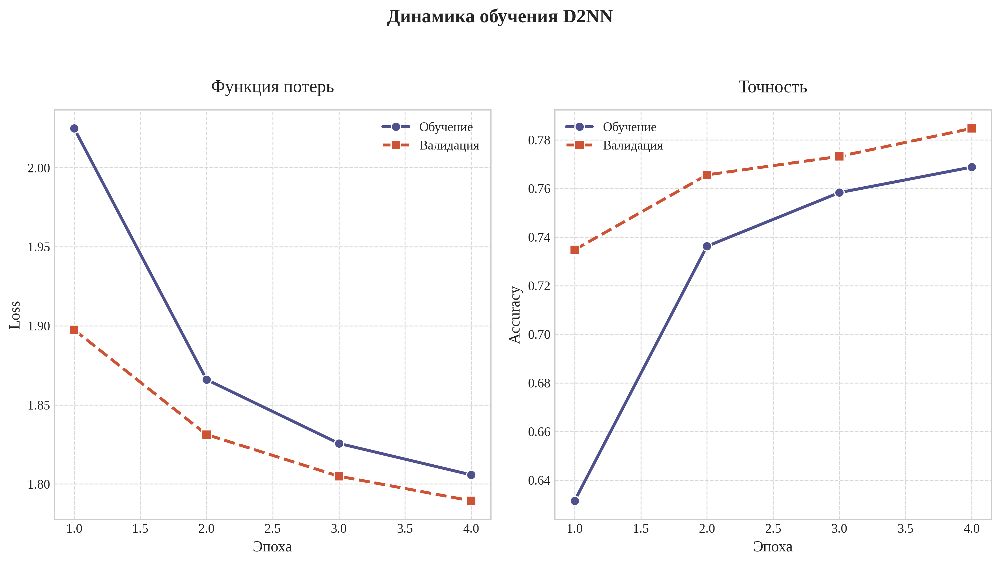

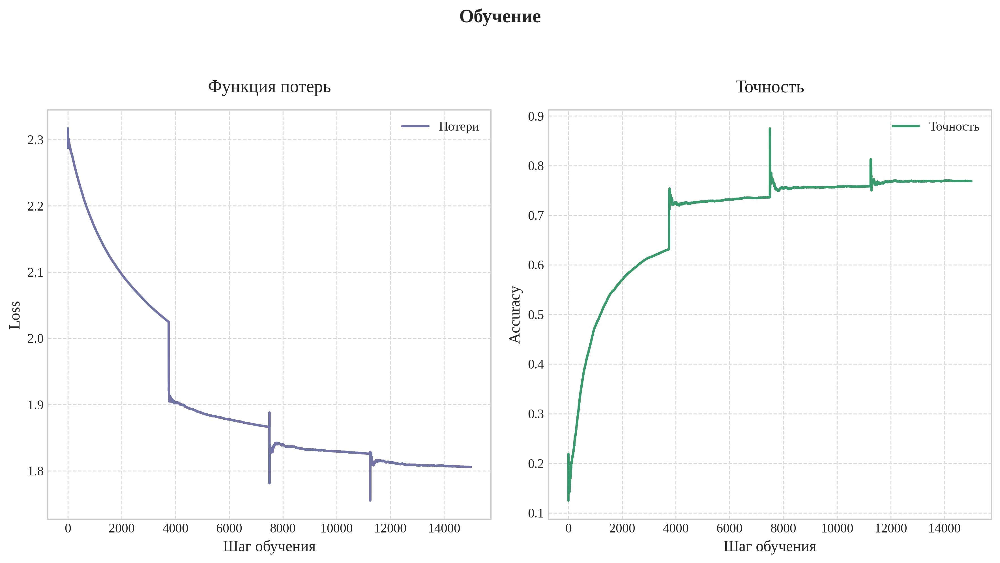

In [37]:
plot_training(history, "training_results_epoch")
plot_batch_training(batch_history, "training_results_baches")

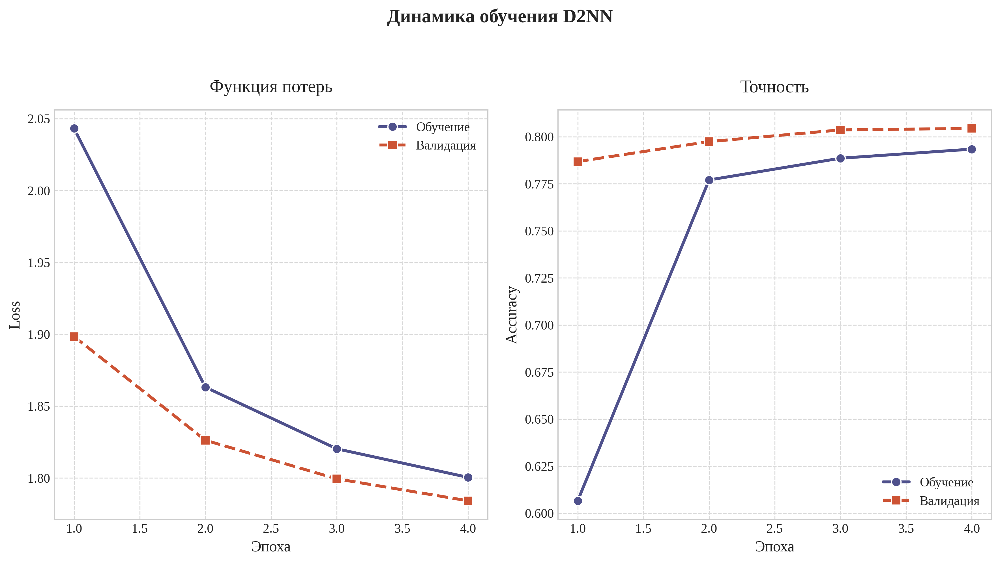

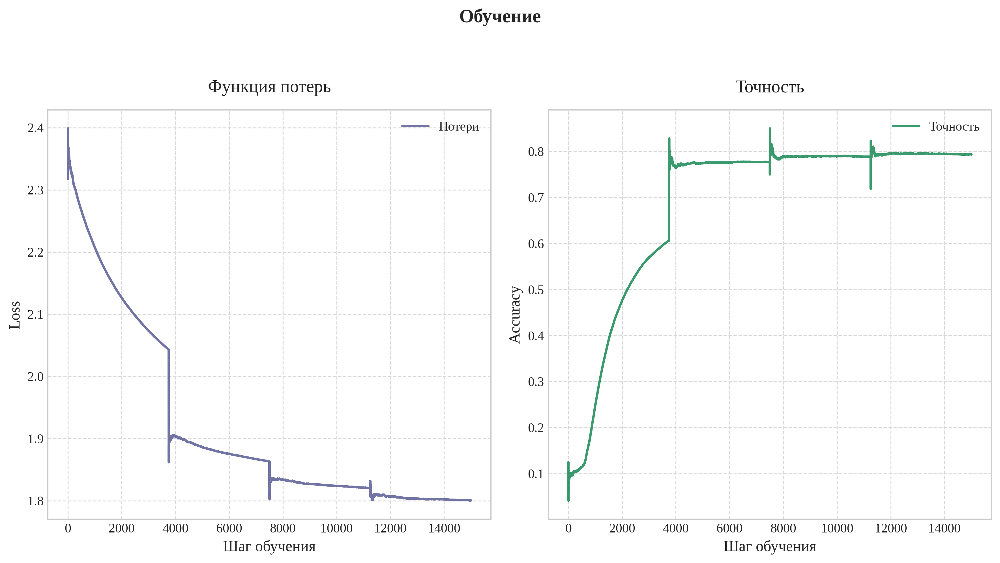

In [38]:
plot_training(history_focus, "training_results_epoch")
plot_batch_training(batch_history_focus, "training_results_baches")

График сравнения:

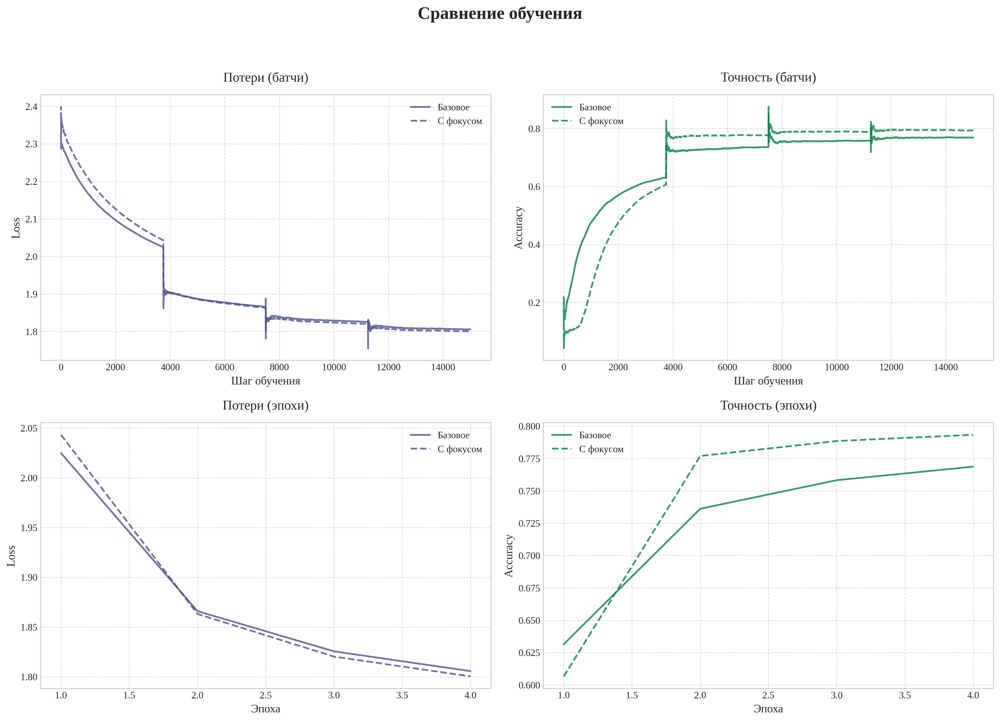

In [39]:
steps_batch = batch_history.batch_steps
losses_batch = batch_history.batch_losses
accuracies_batch = batch_history.batch_accuracies

steps_batch_focus = batch_history_focus.batch_steps
losses_batch_focus = batch_history_focus.batch_losses
accuracies_batch_focus = batch_history_focus.batch_accuracies

steps_epoch = np.arange(1, len(history.history['loss']) + 1)
losses_epoch = history.history['loss']
accuracies_epoch = history.history['accuracy']

steps_epoch_focus = np.arange(1, len(history_focus.history['loss']) + 1)
losses_epoch_focus = history_focus.history['loss']
accuracies_epoch_focus = history_focus.history['accuracy']

# Создание графика 2x2
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.set_facecolor(colors['bg'])

# Батчи - Потери
axes[0, 0].plot(steps_batch, losses_batch, color=colors['loss'], label='Базовое', linewidth=2, alpha=0.8)
axes[0, 0].plot(steps_batch_focus, losses_batch_focus, color=colors['loss'], label='С фокусом', linewidth=2, alpha=0.8, linestyle='--')
axes[0, 0].set_xlabel('Шаг обучения')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Потери (батчи)', pad=15)
axes[0, 0].legend(framealpha=0.9, facecolor='white')
axes[0, 0].grid(color=colors['grid'])
axes[0, 0].set_facecolor(colors['bg'])

# Батчи - Точность
axes[0, 1].plot(steps_batch, accuracies_batch, color=colors['acc'], label='Базовое', linewidth=2, alpha=0.8)
axes[0, 1].plot(steps_batch_focus, accuracies_batch_focus, color=colors['acc'], label='С фокусом', linewidth=2, alpha=0.8, linestyle='--')
axes[0, 1].set_xlabel('Шаг обучения')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].set_title('Точность (батчи)', pad=15)
axes[0, 1].legend(framealpha=0.9, facecolor='white')
axes[0, 1].grid(color=colors['grid'])
axes[0, 1].set_facecolor(colors['bg'])

# Эпохи - Потери
axes[1, 0].plot(steps_epoch, losses_epoch, color=colors['loss'], label='Базовое', linewidth=2, alpha=0.8)
axes[1, 0].plot(steps_epoch_focus, losses_epoch_focus, color=colors['loss'], label='С фокусом', linewidth=2, alpha=0.8, linestyle='--')
axes[1, 0].set_xlabel('Эпоха')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].set_title('Потери (эпохи)', pad=15)
axes[1, 0].legend(framealpha=0.9, facecolor='white')
axes[1, 0].grid(color=colors['grid'])
axes[1, 0].set_facecolor(colors['bg'])

# Эпохи - Точность
axes[1, 1].plot(steps_epoch, accuracies_epoch, color=colors['acc'], label='Базовое', linewidth=2, alpha=0.8)
axes[1, 1].plot(steps_epoch_focus, accuracies_epoch_focus, color=colors['acc'], label='С фокусом', linewidth=2, alpha=0.8, linestyle='--')
axes[1, 1].set_xlabel('Эпоха')
axes[1, 1].set_ylabel('Accuracy')
axes[1, 1].set_title('Точность (эпохи)', pad=15)
axes[1, 1].legend(framealpha=0.9, facecolor='white')
axes[1, 1].grid(color=colors['grid'])
axes[1, 1].set_facecolor(colors['bg'])

fig.suptitle('Сравнение обучения', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('training_results_comparison.png', dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

# 3. Точность модели на других $\lambda$

Загрузим получившуюся модель:

In [40]:
model = get_D2NN_model()
checkpoint_path = './training_results/orig_mnist.weights.h5'
model.load_weights(checkpoint_path)

Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3


In [41]:
def evaluate_model_on_lambda(D2NN, lam_value, test_dataset):

    for layer in D2NN.layers:
        if isinstance(layer, Diffraction_Layer):
            layer.lam.assign(tf.constant(lam_value, dtype=tf.float32))
        elif isinstance(layer, Propagation):
            layer.diff_layer.lam.assign(tf.constant(lam_value, dtype=tf.float32))

    loss, acc = D2NN.evaluate(test_dataset, verbose=0)
    return acc

In [42]:
lambda_list = np.linspace(0.7e-3, 0.8e-3, num=25).tolist()
lambda_results = {}

In [43]:
with tqdm(lambda_list, desc="Различные длины волн", unit="λ") as pbar:
    for lam in pbar:
        acc = evaluate_model_on_lambda(D2NN, lam, f_test_dataset)
        lambda_results[lam] = acc
        print(f"λ = {lam*1e3:.2f} мм → Accuracy: {acc:.4f}")

Различные длины волн:   0%|          | 0/25 [00:00<?, ?λ/s]

W0000 00:00:1761950496.398720      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.70 мм → Accuracy: 0.1028


W0000 00:00:1761950503.776655      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.70 мм → Accuracy: 0.1028


W0000 00:00:1761950510.638284      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.71 мм → Accuracy: 0.1028


W0000 00:00:1761950517.629507      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.71 мм → Accuracy: 0.1035


W0000 00:00:1761950524.517591      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.72 мм → Accuracy: 0.1041


W0000 00:00:1761950531.452149      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.72 мм → Accuracy: 0.1036


W0000 00:00:1761950538.381685      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.72 мм → Accuracy: 0.1029


W0000 00:00:1761950545.329585      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.73 мм → Accuracy: 0.1032


W0000 00:00:1761950552.282905      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.73 мм → Accuracy: 0.1672


W0000 00:00:1761950559.209205      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.74 мм → Accuracy: 0.3830


W0000 00:00:1761950566.210609      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.74 мм → Accuracy: 0.6688


W0000 00:00:1761950573.097947      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.75 мм → Accuracy: 0.7895


W0000 00:00:1761950580.021792      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.75 мм → Accuracy: 0.8044


W0000 00:00:1761950586.992725      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.75 мм → Accuracy: 0.7927


W0000 00:00:1761950593.881449      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.76 мм → Accuracy: 0.6912


W0000 00:00:1761950600.776089      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.76 мм → Accuracy: 0.4361


W0000 00:00:1761950607.761612      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.77 мм → Accuracy: 0.2441


W0000 00:00:1761950614.635500      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.77 мм → Accuracy: 0.1549


W0000 00:00:1761950621.535517      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.78 мм → Accuracy: 0.1038


W0000 00:00:1761950628.424346      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.78 мм → Accuracy: 0.1029


W0000 00:00:1761950635.420766      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.78 мм → Accuracy: 0.1028


W0000 00:00:1761950642.321505      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.79 мм → Accuracy: 0.1028


W0000 00:00:1761950649.204714      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.79 мм → Accuracy: 0.1028


W0000 00:00:1761950656.141566      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.80 мм → Accuracy: 0.1028


W0000 00:00:1761950663.016007      45 auto_shard.cc:553] The `assert_cardinality` transformation is currently not handled by the auto-shard rewrite and will be removed.


λ = 0.80 мм → Accuracy: 0.1028


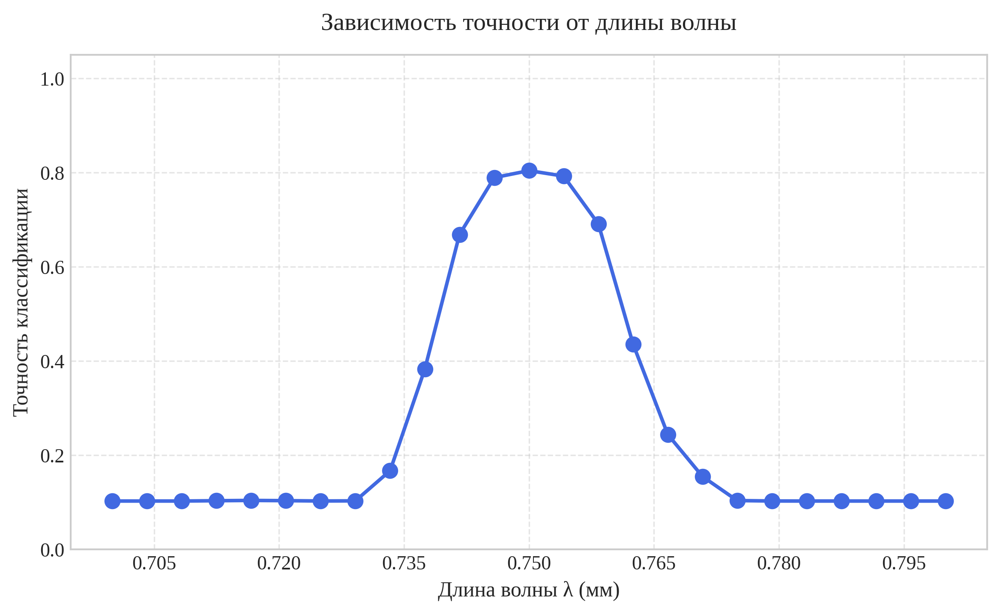

<Figure size 3900x1650 with 0 Axes>

In [44]:
lambda_mm = [lam * 1e3 for lam in lambda_results.keys()]
accuracies = list(lambda_results.values())

plt.figure(figsize=(8, 5))
plt.plot(lambda_mm, accuracies, marker='o', linestyle='-', color='royalblue', linewidth=2)


plt.title('Зависимость точности от длины волны', fontsize=14)
plt.xlabel('Длина волны λ (мм)', fontsize=12)
plt.ylabel('Точность классификации', fontsize=12)
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=10))
plt.ylim(0, 1.05)

plt.tight_layout()
plt.show()
plt.savefig("lambda_acc.png", dpi=300, bbox_inches='tight')

In [45]:
def evaluate_with_relative_noise(base_model, test_dataset, percent_noise_list):
    results = {}

    for percent in percent_noise_list:
        # Клонируем модель и копируем веса
        model = get_D2NN_model()
        model.set_weights(base_model.get_weights())

        # Вносим относительный шум в фазовые маски
        for layer in model.layers:
            if hasattr(layer, "phase"):
                phase = layer.phase.numpy()
                
                # Процентный шум: std = percent * |phi|
                std_matrix = np.abs(phase) * percent
                noise = np.random.normal(loc=0.0, scale=std_matrix)
                
                # Добавляем шум, обрезаем в диапазон [0, 2π]
                noisy_phase = (phase + noise) % (2 * np.pi)
                layer.phase.assign(noisy_phase.astype(np.float32))

        model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
        loss, acc = model.evaluate(test_dataset, verbose=0)
        results[percent] = acc
        print(f"Шум {percent*100:.1f}% от значения фазы → Accuracy: {acc:.4f}")

    return results

In [46]:
percent_levels = np.linspace(0.0, 1, num=25).tolist()
relative_noise_results = evaluate_with_relative_noise(model, f_test_dataset, percent_levels)

Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3


I0000 00:00:1761950672.508677     119 service.cc:148] XLA service 0x47ceb260 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761950672.510886     119 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1761950672.876408     119 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1761950674.006863     119 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Шум 0.0% от значения фазы → Accuracy: 0.8044
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 4.2% от значения фазы → Accuracy: 0.7982
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 8.3% от значения фазы → Accuracy: 0.7785
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 12.5% от значения фазы → Accuracy: 0.6664
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 16.7% от значения фазы → Accuracy: 0.3901
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 20.8% от значения фазы → Accuracy: 0.1601
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 25.0% от значения фазы → Accuracy: 0.1351
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 29.2% от значения фазы → Accuracy: 0.0975
Детектор инициализирован с числом классов: 10
Размеры сетки детектора: 4×3
Шум 33.3% от значения фазы → Accura

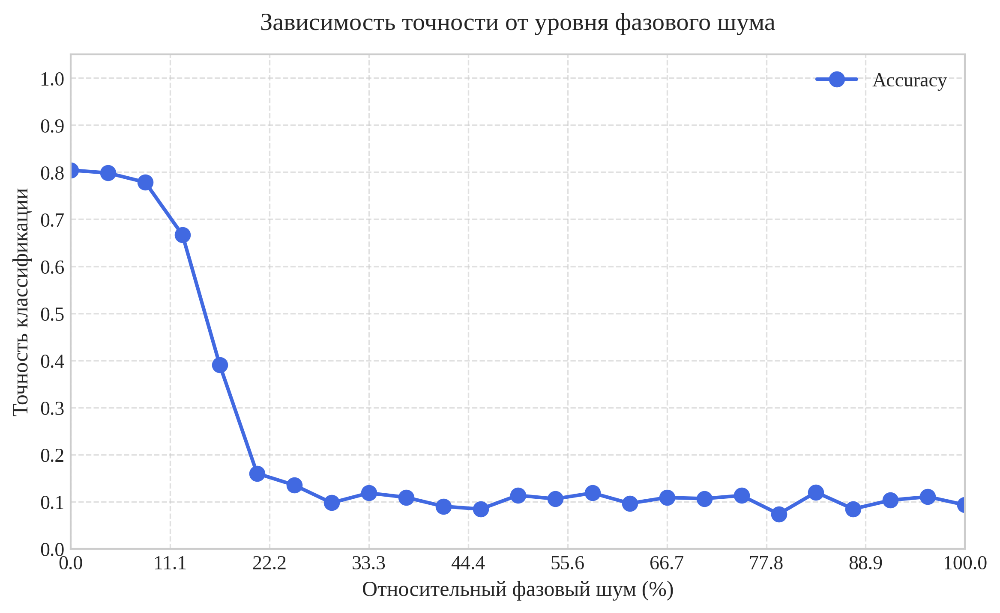

<Figure size 3900x1650 with 0 Axes>

In [47]:
x = [p * 100 for p in relative_noise_results.keys()]
y = list(relative_noise_results.values())

# Построение графика
plt.figure(figsize=(8, 5))
plt.plot(x, y, marker='o', linewidth=2, color='royalblue', label='Accuracy')

# Оформление
plt.title("Зависимость точности от уровня фазового шума", fontsize=14)
plt.xlabel("Относительный фазовый шум (%)", fontsize=12)
plt.ylabel("Точность классификации", fontsize=12)
plt.ylim(0, 1.05)
plt.xlim(0, max(x))
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.xticks(np.linspace(0, max(x), 10))
plt.yticks(np.linspace(0, 1.0, 11))
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()
plt.savefig("noise_accuracy.png", dpi=300, bbox_inches='tight')